# Proyecto 03 - Series de Tiempo

## Dataset: Flujo Vehicular por Unidades de Peaje AUSA

**Recuerda descargar el dataset de [aquí](https://data.buenosaires.gob.ar/dataset/flujo-vehicular-por-unidades-peaje-ausa). Deberás descargar -  al menos para comenzar - los años 2017, 2018 y 2019.**

En este notebook te dejamos unas celdas para que puedas comenzar a trabajar con este dataset para los años 2017, 2018 y 2019. Si deseas utilizar otros años, ten en cuenta que deberás hacer el preprocesamiento correspondiente, ya que la estructura de los datos puede variar.

**Importante:** Para el proyecto, debes comenzar con los datos de la autopista Illia, pago en Efectivo.

### 1.- Exploración de datos

Dedícale un buen tiempo a hacer un Análisis Exploratorio de Datos. Elige preguntas que creas que puedas responder con este dataset. Por ejemplo, ¿Cuáles son los días y horarios de mayor tráfico? También, estudia autocorrelaciones, resampleos, etc.

### 2.- Componentes de la serie

1. Calcula las componentes estacionales y tendencia de la serie. Interpreta los resultados, si es necesario con información auxiliar (por fuera del dataset) o elementos del dataset que no estés utilizando (por ejemplo, si la tendencia es negativa, ¿puede ser porque se migre a otras formas de pago?).
1. ¿La serie posee valores atípicos? Si es así, interpreta, si es necesario con información auxiliar. **Pista**: primer semestre 2019.

### Predicción a Futuro

Debes implementar un modelo que prediga el tráfico en la autopista Illia para el último trimestre del 2019. 

1. Haz todas las transformaciones de datos que consideres necesarias. Justifica.
1. Evalúa de forma apropiada tus resultados. Justifica la métrica elegida.
1. Elige un modelo benchmark y compara tus resultados con este modelo.
1. Optimiza los hiperparámetros de tu modelo. 
1. Intenta responder la pregunta: ¿Qué información está usando el modelo para predecir?
1. Utiliza el modelo creado para predecir el tráfico en el año 2020. ¿Cómo funciona?
1. Si lo deseas, puedes agregar información de años anteriores a 2017. ¿Mejoran los resultados?

### Para pensar, investigar y, opcionalmente, implementar
1. ¿Cómo incorporarías la información sobre tipo de vehículo, forma de pago, sentido, día de la semana, etc.? En lo que respecta a las predicciones, ¿mejoran o empeoran?
1. ¿Qué ocurre si comparas las series de tiempo entre distintas estaciones de peajes?¿Tienen el mismo comportamiento o hay alguna que sea distinta a las otras? Si es así, ¿hay información auxiliar que te ayude a explicar lo que encuentras?
1. ¿Hay algo que te gustaría investigar o probar?

### **¡Tómate tiempo para investigar y leer mucho!**

### Preparación del Dataset

El modelo correspondorá a pronóstico univariante de series de tiempo : solo dos variables en las que una es el tiempo y la otra es el campo a pronosticar.

In [ ]:

#Importando las librerias basicas y necesarias
import pandas as pd #Libreria de manipulacion de datos
import numpy as np #Libreria numerica muy potente
import matplotlib.pyplot as plt #Libreria para graficos
import seaborn as sns #Libreria para graficos basada en Matplotlib (es mas simple)
import datetime


# IMPORTO LAS LIBRERIAS NECESITARÉ PARA EL MODELO DE MACHINE LEARNING
import pandas as pd
from sklearn.model_selection import train_test_split #Separar conjunto de dataset en valores de entrenamiento
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
#from google.colab import drive
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer
from sklearn.metrics import mean_squared_error
from sklearn.metrics import median_absolute_error
sns.set()


# 1.- Exploración de datos

Dedícale un buen tiempo a hacer un Análisis Exploratorio de Datos. Elige preguntas que creas que puedas responder con este dataset. Por ejemplo, ¿Cuáles son los días y horarios de mayor tráfico? También, estudia autocorrelaciones, resampleos, etc.!

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
data_2019 = pd.read_csv("/content/gdrive/MyDrive/Colab_Notebooks/PROYECTO_3/flujo-vehicular-2019.csv", sep =',')
data_2018 = pd.read_csv('/content/gdrive/MyDrive/Colab_Notebooks/PROYECTO_3/flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('/content/gdrive/MyDrive/Colab_Notebooks/PROYECTO_3/flujo-vehicular-2017.csv', sep =',')

In [ ]:
data_2019.info()
data_2019.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812153 entries, 0 to 812152
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   periodo         812153 non-null  int64 
 1   fecha           812153 non-null  object
 2   hora_inicio     812153 non-null  int64 
 3   hora_fin        812153 non-null  int64 
 4   dia             812153 non-null  object
 5   estacion        812153 non-null  object
 6   sentido         812153 non-null  object
 7   tipo_vehiculo   812153 non-null  object
 8   forma_pago      812153 non-null  object
 9   cantidad_pasos  812153 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 62.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,NO COBRADO,22
1,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,TELEPASE,6
2,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,NO COBRADO,53
3,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,TELEPASE,18
4,2019,2019-01-01,0,1,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16


In [ ]:
data_2018.info()
data_2018.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1375908 entries, 0 to 1375907
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1375908 non-null  int64 
 1   fecha           1375908 non-null  object
 2   hora_inicio     1375908 non-null  int64 
 3   hora_fin        1375908 non-null  int64 
 4   dia             1375908 non-null  object
 5   estacion        1375908 non-null  object
 6   sentido         1375908 non-null  object
 7   tipo_vehiculo   1375908 non-null  object
 8   forma_pago      1375908 non-null  object
 9   cantidad_pasos  1375908 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 105.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,NO COBRADO,29
1,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,TELEPASE,9
2,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,NO COBRADO,73
3,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,TELEPASE,39
4,2018,2018-01-01,2,3,Lunes,Alberdi,Centro,Liviano,NO COBRADO,115


In [ ]:
data_2017.info()
data_2017.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1372645 entries, 0 to 1372644
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1372645 non-null  int64 
 1   fecha           1372645 non-null  object
 2   hora_inicio     1372645 non-null  int64 
 3   hora_fin        1372645 non-null  int64 
 4   dia             1372645 non-null  object
 5   estacion        1372645 non-null  object
 6   sentido         1372645 non-null  object
 7   tipo_vehiculo   1372645 non-null  object
 8   forma_pago      1372645 non-null  object
 9   cantidad_pasos  1372645 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 104.7+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,NO COBRADO,25
1,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,TELEPASE,7
2,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,NO COBRADO,5
3,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,2
4,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,94


Investiguemos que valores toman los campos **estacion, sentido, tipo_vehiculo y forma_pago**

In [ ]:
# Cuáles son los tipos de Variables de la Columna Estación?
print("Variables de la Columna Estación - 2019", data_2019['estacion'].unique())
print("Variables de la Columna Estación - 2018", data_2018['estacion'].unique())
print("Variables de la Columna Estación - 2017", data_2017['estacion'].unique())

Variables de la Columna Estación - 2019 ['Alberti' 'Avellaneda' 'Dellepiane' 'Illia' 'Retiro' 'Salguero'
 'Sarmiento' 'PDB']
Variables de la Columna Estación - 2018 ['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']
Variables de la Columna Estación - 2017 ['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']


In [ ]:
# Cuáles son los tipos de Variables de la Columna Estación?
print(data_2019['dia'].unique())
print(data_2018['dia'].unique())
print(data_2017['dia'].unique())

['Martes' 'Viernes' 'Lunes' 'Miércoles' 'Sábado' 'Jueves' 'Domingo']
['Lunes' 'Martes' 'Miércoles' 'Jueves' 'Viernes' 'Sábado' 'Domingo']
['Domingo' 'Lunes' 'Martes' 'Miércoles' 'Jueves' 'Viernes' 'Sábado']


In [ ]:
# Cuáles son los tipos de Variables de la Columna Sentido?
print(data_2019['sentido'].unique())
print(data_2018['sentido'].unique())
print(data_2017['sentido'].unique())

['Centro' 'Provincia']
['Centro' 'Provincia']
['Centro' 'Provincia']


In [ ]:
# Cuáles son los tipos de Vehiculos del Dataset?
print(data_2019['tipo_vehiculo'].unique())
print(data_2018['tipo_vehiculo'].unique())
print(data_2017['tipo_vehiculo'].unique())

['Liviano' 'Pesado']
['Liviano' 'Pesado']
['Liviano' 'Pesado']


In [ ]:
# Cuáles son los tipos de Variables de la Columna Forma de Pago?
print(data_2019['forma_pago'].unique())
print(data_2018['forma_pago'].unique())
print(data_2017['forma_pago'].unique())

['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'INFRACCION'
 'T. DISCAPACIDAD']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'TARJETA DISCAPACIDAD'
 'INFRACCION']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'TARJETA DISCAPACIDAD' 'EXENTO'
 'INFRACCION' 'MONEDERO' 'Otros']


 Podemos decir entonces que los años 2017, 2018 y 2019 tienen las siguientes columnas con la siguiente información:

- **periodo**: año del dset 
- **fecha**: año dia mes
- **hora_inicio** hora de inicio de la cuenta de vehiculos (DROP)
- **hora_fin** hora de fin de la cuenta de vehiculos (Vamos a usar esta para tomar la hora)
- **dia**: dia de la semana 
- **estacion**: estaciones de peaje, difieren levemente entre los años (Dellepiane se unifica en 2019, antes habia Dellepiane Liniers y Centro, y se agrega PDB)
- **sentido**: Centro o Provincia
- **tipo_vehiculo**: Liviano o Pesado
- **forma_pago**: Hay varias y varian entre los años.
- **cantidad_pasos**: Cantidad de vehiculos

Vamos a estar trabajando con la estación **Illia** y la forma de pago **Efectivo**


In [ ]:
#Unimos los 3 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
dataset = pd.concat([data_2019, data_2018, data_2017])
print("Unimos los 3 datasets",dataset.shape)

#Nos quedamos solamente con la estación Illia y la forma de pago Efectivo
mask = np.logical_and(dataset.estacion=='Illia', dataset.forma_pago == 'EFECTIVO')
dataset = dataset[mask]
print("Nos quedamos solamente con la estación Illia y la forma de pago Efectivo",dataset.shape)

#Quitamos las columnas que no vamos a utilizar
dataset.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion'], inplace = True)

print(dataset.head())
print("Quitamos las columnas que no vamos a utilizar",dataset.shape)

Unimos los 3 datasets (3560706, 10)
Nos quedamos solamente con la estación Illia y la forma de pago Efectivo (238869, 10)
          fecha  hora_fin     dia    sentido tipo_vehiculo  cantidad_pasos
80   2019-01-01         2  Martes     Centro       Liviano             537
86   2019-01-01         2  Martes     Centro        Pesado               1
88   2019-01-01         2  Martes  Provincia       Liviano             443
94   2019-01-01         2  Martes  Provincia        Pesado               1
149  2019-01-01         3  Martes     Centro       Liviano             769
Quitamos las columnas que no vamos a utilizar (238869, 6)


In [ ]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset.drop(columns=['fecha','hora_fin'], inplace = True)

dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha2
80,Martes,Centro,Liviano,537,2019-01-01 02:00:00
86,Martes,Centro,Pesado,1,2019-01-01 02:00:00
88,Martes,Provincia,Liviano,443,2019-01-01 02:00:00
94,Martes,Provincia,Pesado,1,2019-01-01 02:00:00
149,Martes,Centro,Liviano,769,2019-01-01 03:00:00


In [ ]:
#Corregimos el nombre de fecha2 a fecha
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True) 
dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
80,Martes,Centro,Liviano,537,2019-01-01 02:00:00
86,Martes,Centro,Pesado,1,2019-01-01 02:00:00
88,Martes,Provincia,Liviano,443,2019-01-01 02:00:00
94,Martes,Provincia,Pesado,1,2019-01-01 02:00:00
149,Martes,Centro,Liviano,769,2019-01-01 03:00:00


In [ ]:
#Reordenamos el dataset por fecha
dataset.sort_values('fecha', inplace = True)
dataset.reset_index(drop=True, inplace = True)
dataset

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
1,Domingo,Provincia,Liviano,9,2017-01-01 00:00:00
2,Domingo,Provincia,Liviano,644,2017-01-01 00:00:00
3,Domingo,Provincia,Pesado,6,2017-01-01 00:00:00
4,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
...,...,...,...,...,...
238864,Martes,Provincia,Liviano,556,2019-12-31 22:00:00
238865,Martes,Provincia,Pesado,1,2019-12-31 22:00:00
238866,Martes,Centro,Liviano,580,2019-12-31 22:00:00
238867,Martes,Centro,Liviano,214,2019-12-31 23:00:00


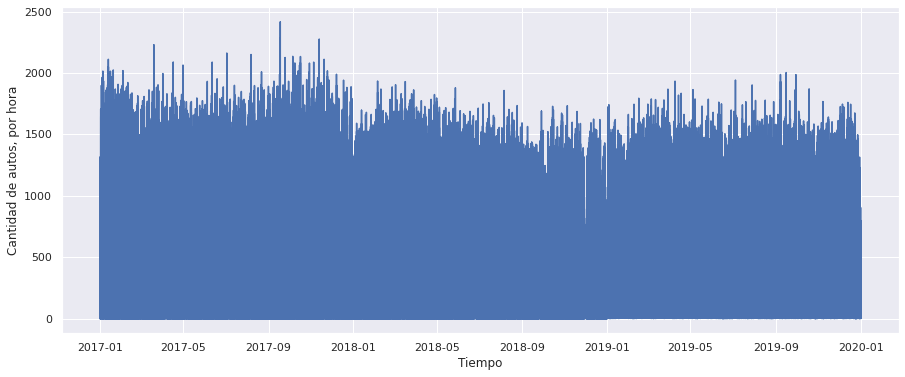

In [ ]:
#Graficamos nuestros datos, tal como están
plt.figure(figsize = (15,6))
plt.plot(dataset.fecha, dataset.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

In [ ]:
#Resampleamos nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
diario = dataset.resample('D', on = 'fecha').sum()
print(diario.shape)

diario= pd.DataFrame(diario)
diario.head()

(1095, 1)


,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486


In [ ]:
diario.describe()

,cantidad_pasos
count,1095.000000
mean,43712.859361
std,8192.736927
min,0.000000
25%,39061.500000
50%,43761.000000
75%,49498.000000
max,63127.000000


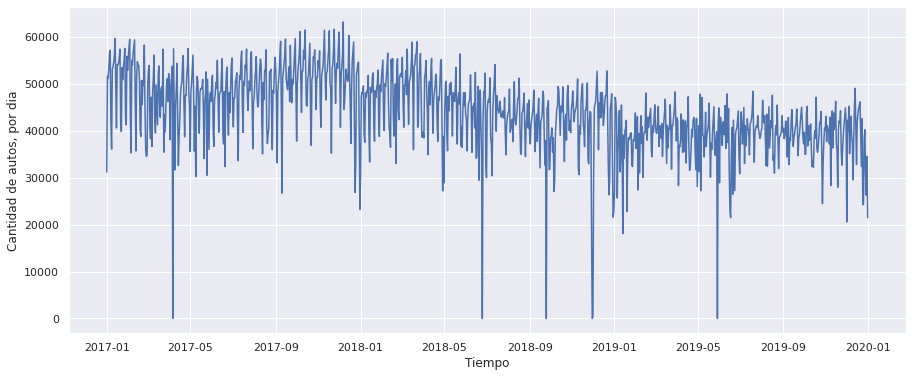

In [ ]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

Acá tenemos una serie de tiempo donde se observa comportamiento diario y datos que potencialmente son outliers ya que no tienen mucho sentido

# 2.- Componentes de la Serie

## 2.1.- Valores atípicos
 Pista: primer semestre 2019.

In [ ]:
#2.-Reviso el total de valores faltantes NaN del dataset :
print("Los valores nulos del dataset son: ")
diario.isna().sum() #Si no se utiliza el sum() va a devolver la condicion True o False de los campos

Los valores nulos del dataset son: 


cantidad_pasos    0
dtype: int64

Cantidad de instancias que tiene el Dataset antes de la eliminación de Outliers (1095, 1)
El número de outliers detectados es  7
El Valor máximo es  68291.07014138575
El Valor mínimo es  19134.64858007545
Cantidad de instancias que tiene el Dataset después de la eliminación de Outliers (1088, 1)


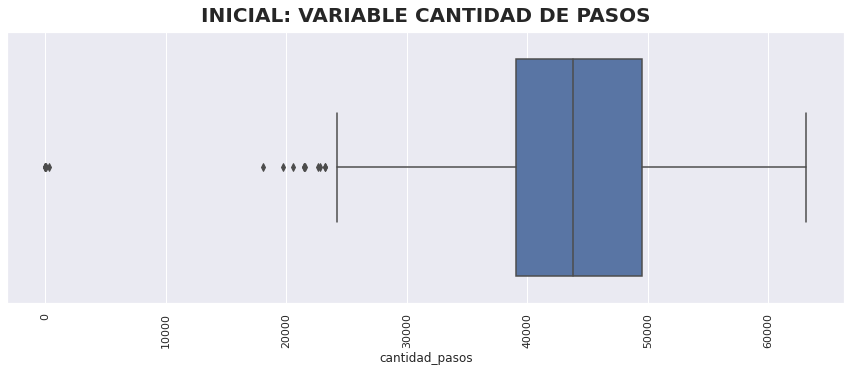

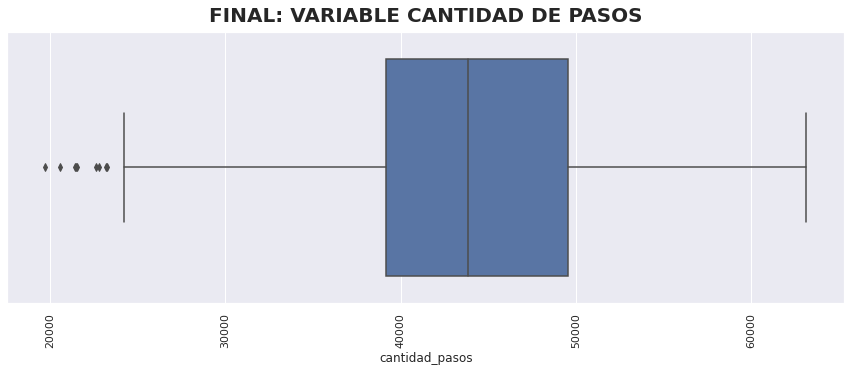

In [ ]:
# Reviso un BoxPlot de la cantidad de pasos 
plt.figure(figsize = (15, 5))
sns.boxplot( x = 'cantidad_pasos',  data = diario)
plt.title("INICIAL: VARIABLE CANTIDAD DE PASOS", pad=10, fontsize=20,fontweight="bold")
xt = plt.xticks(rotation=90)
print("Cantidad de instancias que tiene el Dataset antes de la eliminación de Outliers", diario.shape)

valor_medio = diario.cantidad_pasos.mean()
std = diario.cantidad_pasos.std()
minimo = valor_medio - 3*std
maximo = valor_medio + 3*std
mascara_outliers = np.logical_or(diario.cantidad_pasos < minimo, diario.cantidad_pasos > maximo)
print("El número de outliers detectados es ",mascara_outliers.sum())
print("El Valor máximo es ", maximo)
print("El Valor mínimo es ", minimo)

#Sacando los Outliers
mascara = diario["cantidad_pasos"]<maximo
diario=diario[mascara]
mascara = diario["cantidad_pasos"]>minimo
diario=diario[mascara]

plt.figure(figsize = (15, 5))
sns.boxplot( x = 'cantidad_pasos',  data = diario)
plt.title("FINAL: VARIABLE CANTIDAD DE PASOS", pad=10, fontsize=20,fontweight="bold")
xt = plt.xticks(rotation=90)
print("Cantidad de instancias que tiene el Dataset después de la eliminación de Outliers", diario.shape)

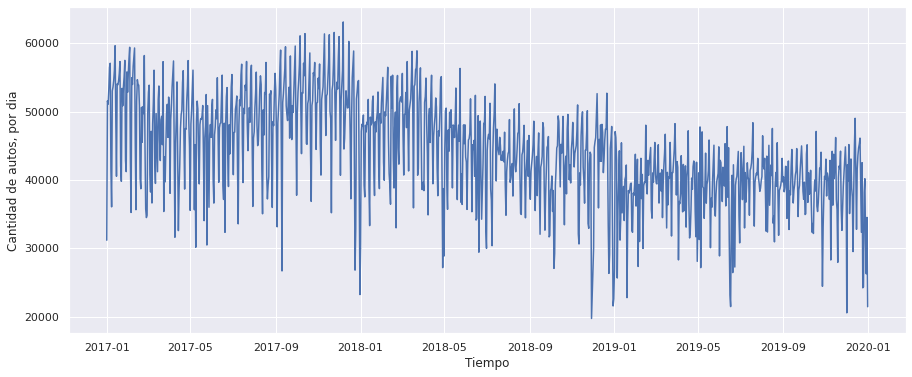

In [ ]:
#Mirando nuevamente el grafico ahora sin Outliers
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

En el BoxPlot y el grafico se observa una mejora en la visualización de la serie.

## 2.2.- Analisis de Tendencia
### Revisando la Media Movil
Es el proceso de tomar una ventana, trasladarlo a lo largo de una serie de tiempo y hacer alguna operación en esa ventana se conoce como rolling window. En general, se utiliza junto con la media, pero también se podría obtener el máximo, mínimo o cualquier otro estadístico.

Vamos a operar sobre la serie semanal promedio.

In [ ]:
#Media Movil
ventana = int(7)
diario_promedio_tendencia = diario.cantidad_pasos.rolling(window=ventana, center = True).mean()
diario_promedio_tendencia

fecha
2017-01-01             NaN
2017-01-02             NaN
2017-01-03             NaN
2017-01-04    48904.285714
2017-01-05    49601.714286
                  ...     
2019-12-27    31197.428571
2019-12-28    30801.285714
2019-12-29             NaN
2019-12-30             NaN
2019-12-31             NaN
Name: cantidad_pasos, Length: 1088, dtype: float64

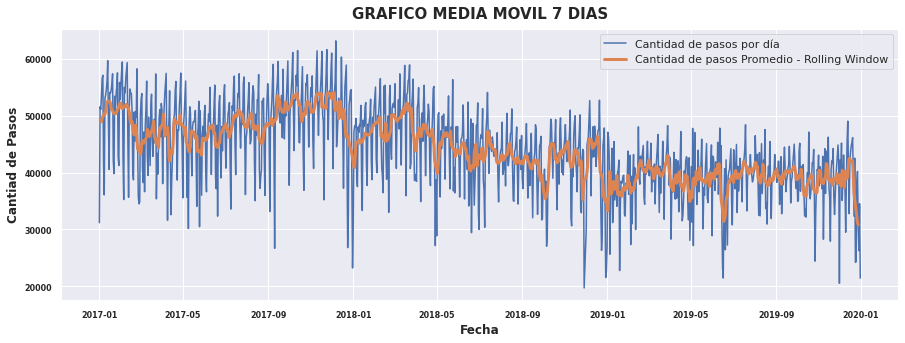

In [ ]:
#Graficando
plt.figure(figsize = (15,5))
plt.plot(diario.index, diario.cantidad_pasos, label = 'Cantidad de pasos por día')
plt.plot(diario_promedio_tendencia, lw = 3, label = 'Cantidad de pasos Promedio - Rolling Window')
plt.xlabel('Fecha', fontweight="bold")
plt.ylabel('Cantiad de Pasos', fontweight="bold")
plt.legend()
plt.title("GRAFICO MEDIA MOVIL 7 DIAS", pad=10, fontsize=15, fontweight="bold")
plt.xticks(fontsize=8, fontweight="bold")
plt.yticks(fontsize=8, fontweight="bold")
plt.show()



Este grafico por si sólo me permite observar ciertas tendencia a la baja pero sin mayor claridad.

### Revisando la Tendencia Lineal

Este método consiste simplemente en ajustar una regresión lineal a la serie. La validez de este método es muy limitada pero la utilizaré para ir examinando los datos.
Para comenzar, hay que tener en cuenta es que no podemos ajustar una regresión lineal con las fechas, por lo que las pasaré a un formato numérico:

In [ ]:
import datetime
diario['fecha_numeros']=diario.index.map(datetime.datetime.toordinal)
diario.head()

,cantidad_pasos,fecha_numeros
fecha,,
2017-01-01,31183,736330
2017-01-02,51568,736331
2017-01-03,51093,736332
2017-01-04,53332,736333
2017-01-05,56486,736334


In [ ]:
#Ahora haré la regresión lineal
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(diario.fecha_numeros.values.reshape(-1, 1), diario.cantidad_pasos)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

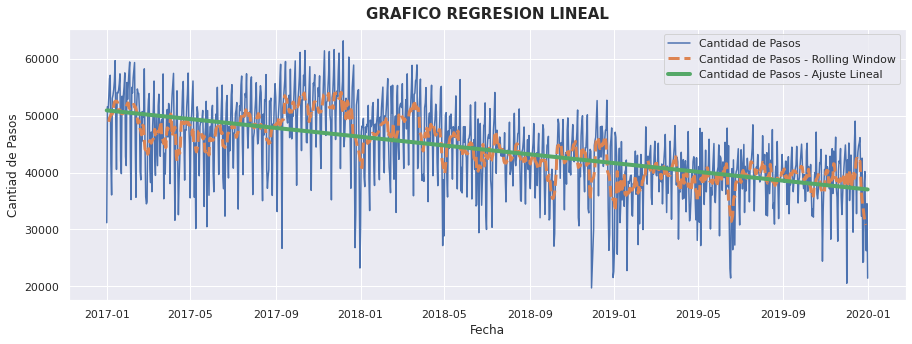

In [ ]:
plt.figure(figsize = (15,5))
plt.plot(diario.index, diario.cantidad_pasos, label = 'Cantidad de Pasos')
plt.plot(diario_promedio_tendencia, ls = '--', lw = 3, label = 'Cantidad de Pasos - Rolling Window')
plt.plot(diario.index, lr.predict(diario.fecha_numeros.values.reshape(-1, 1)), lw = 4, label = 'Cantidad de Pasos - Ajuste Lineal')
# plt.xlim(datetime.date(1985,1,1), datetime.date(2018,1,1))
# plt.ylim([0,30])
plt.xlabel('Fecha')
plt.ylabel('Cantiad de Pasos')
plt.title("GRAFICO REGRESION LINEAL", pad=10, fontsize=15, fontweight="bold")
plt.legend()
plt.show()

Graficando la regresión lineal se puede capturar el componente tendencial que a simple vista es a la baja, seguiré analizando los datos para poder explorarlos en mayor profundidad.

In [ ]:
#Borro la columna generada para optimizar la velocidad de los calculos
diario= diario.drop(['fecha_numeros'],axis=1)
diario.head()


,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486


## 2.3.- Componentes de la Serie
Obtener componentes de una Serie de Tiempo es un tema amplio y, como siempre, depende del problema en el que se este trabajando. Algunas series se comportan como  𝑇𝑒𝑛𝑑𝑒𝑛𝑐𝑖𝑎+𝐸𝑠𝑡𝑎𝑐𝑖𝑜𝑛𝑎𝑙𝑖𝑑𝑎𝑑+𝑅𝑢𝑖𝑑𝑜 , mientras que otras tienen comportamientos más complejos. Existen muchas formas de obtener las componentes, pero no todas funcionarán en todos los casos. Además, cada técnica tiene sus ventajas y desventajas. Por lo que haré una enumeración y demostración de algunos métodos.

El método más sencillo se conoce como media móvil. Consiste en tomar una ventana de tiempo suficientemente grande que en este caso será una semana y se promediará la serie sobre esa ventana. De esta forma, se obtendrá la tendencia. Una característica de este método es que no asume ninguna forma para la serie de tiempo a diferencia de otros así que suele funcionar en muchos casos.

Supongamos que tienes motivos para creer que la tendencia sigue un comportamiento lineal. Entonces, basta con ajustar una regresión lineal a la serie (antes también la puedes haber promediado con el método anterior) para obtener la tendencia. Este método también sirve si tienes motivos para creer que la tendencia sigue una forma arbitraria pero conocida (por ejemplo, cuadrática, exponencial, tipo seno o coseno, etc.).

Una vez que se obtienes la tendencia, en ambos casos puedes tomar la serie original, restar la tendencia y obtener una nueva serie sin tendencia, donde esperamos que sea la componente estacional la que domine.

Luego, para obtener componentes estacionales, se suele asumir una forma armónica (tipo seno o coseno). Es decir, se puede hacer un procedimiento similar al que hiciste con la tendencia (ajustar y restar a la serie sin tendencia) para obtener ruido + componentes restantes.

Veamos un poco como se traduce esto en el código.

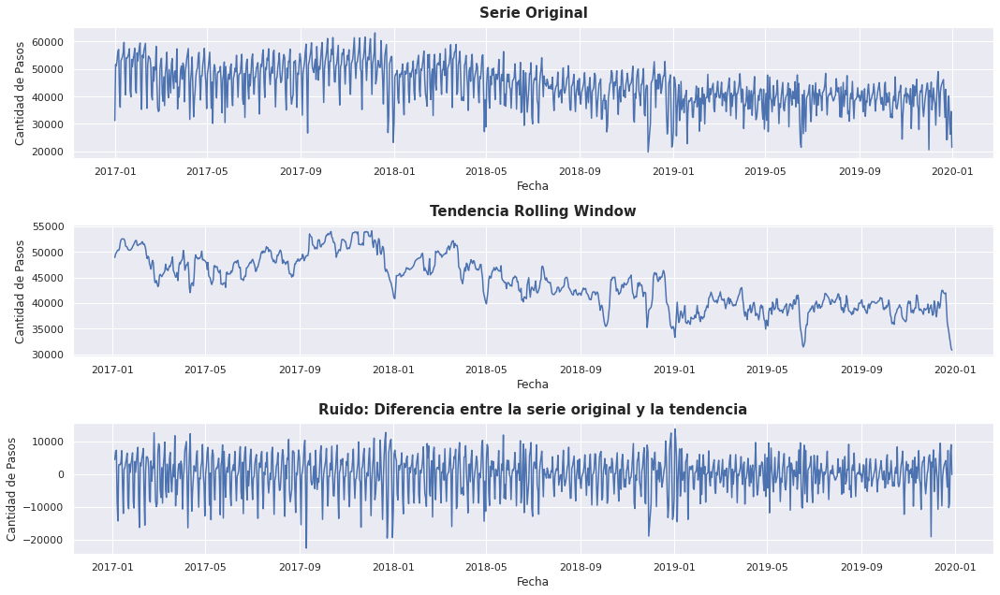

In [ ]:
#Hecho a Mano - Obteniendo los componentes restantes
plt.figure(figsize = (15,9))

plt.subplot(3,1,1)
plt.title("Serie Original", pad=10, fontsize=15, fontweight="bold")
plt.plot(diario.index, diario.cantidad_pasos)
plt.ylabel('Cantidad de Pasos')
plt.xlabel('Fecha')


plt.subplot(3,1,2)
plt.title("Tendencia Rolling Window", pad=10, fontsize=15, fontweight="bold")
plt.plot(diario_promedio_tendencia)
plt.ylabel('Cantidad de Pasos')
plt.xlabel('Fecha')


plt.subplot(3,1,3)
plt.title("Ruido: Diferencia entre la serie original y la tendencia", pad=10, fontsize=15, fontweight="bold")
plt.plot(diario.index, diario.cantidad_pasos - diario_promedio_tendencia)
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Pasos')

plt.tight_layout()
plt.show()


Una forma común de interpretar las componentes es parándose en la tendencia y diferenciar el aporte de cada estación. Por ejemplo, podríamos decir que la cantidad de pasos promedios en Illia es de alrededor de 45.000, con una componente estacional del orden de 7.500 pasos más y  del orden de 7.500 pasos menos.
En el 3º grafico se puede observar el componente aleatorio de la serie, es decir el Ruido.

In [ ]:
diario['fecha1'] = pd.to_datetime(diario.index)
diario.head()

,cantidad_pasos,fecha1
fecha,,
2017-01-01,31183,2017-01-01
2017-01-02,51568,2017-01-02
2017-01-03,51093,2017-01-03
2017-01-04,53332,2017-01-04
2017-01-05,56486,2017-01-05


In [ ]:
print(diario.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1088 entries, 2017-01-01 to 2019-12-31
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   cantidad_pasos  1088 non-null   int64         
 1   fecha1          1088 non-null   datetime64[ns]
dtypes: datetime64[ns](1), int64(1)
memory usage: 25.5 KB
None


In [ ]:
#Paso a Semana para poder aplicar la descomposición
semanal = diario.resample('W', on = 'fecha1').mean()
print(semanal.head())
print(semanal.shape)
print(diario.shape)

            cantidad_pasos
fecha1                    
2017-01-01    31183.000000
2017-01-08    49601.714286
2017-01-15    52344.714286
2017-01-22    51030.714286
2017-01-29    50654.428571
(158, 1)
(1088, 2)


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

#Realizando
result = seasonal_decompose(semanal.cantidad_pasos, model='additive')
# result.plot()
# pyplot.show()

In [ ]:
result.trend

fecha1
2017-01-01   NaN
2017-01-08   NaN
2017-01-15   NaN
2017-01-22   NaN
2017-01-29   NaN
              ..
2019-12-08   NaN
2019-12-15   NaN
2019-12-22   NaN
2019-12-29   NaN
2020-01-05   NaN
Freq: W-SUN, Name: cantidad_pasos, Length: 158, dtype: float64

In [ ]:
result.seasonal

fecha1
2017-01-01   -4430.496608
2017-01-08   -5308.198531
2017-01-15   -2594.406635
2017-01-22   -2723.363366
2017-01-29   -2215.215701
                 ...     
2019-12-08    4198.216304
2019-12-15    3938.903804
2019-12-22    1312.677156
2019-12-29   -4430.496608
2020-01-05   -5308.198531
Freq: W-SUN, Name: cantidad_pasos, Length: 158, dtype: float64

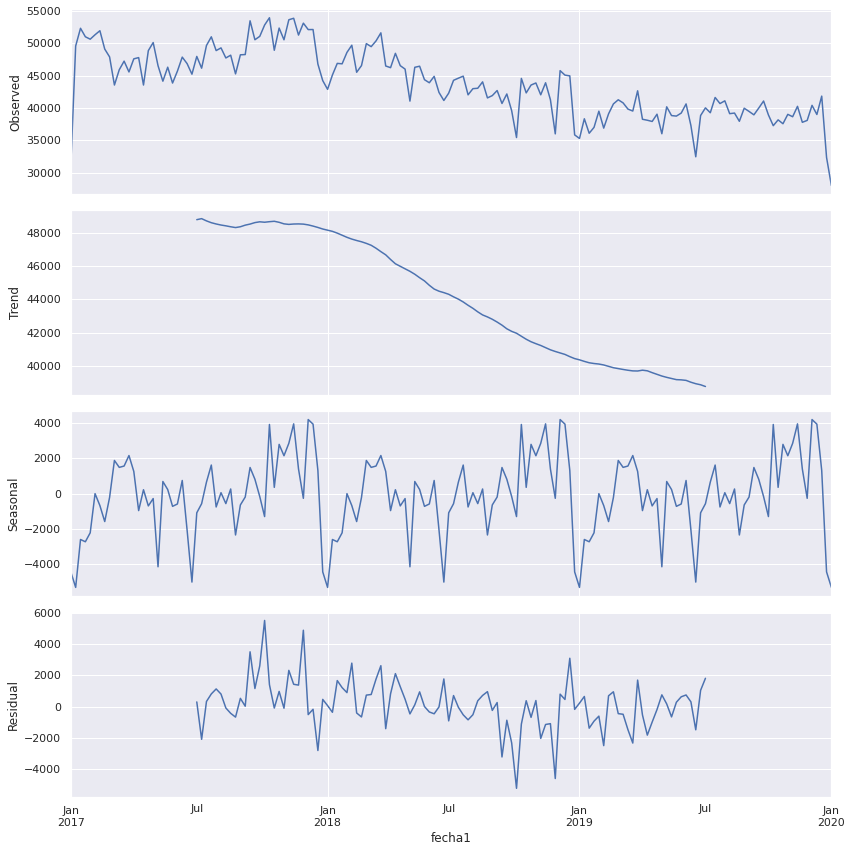

In [ ]:
#Graficando
import matplotlib
matplotlib.rcParams['figure.figsize'] = [12,12]
result.plot()
plt.show()

Acá puedo verlos  componentes de la serie de tiempo. Esta es una descomposición simple.
- En el primer grafico observo la linea original.
- En el segundo grafico observo la tendencia.
- En el tercer grafico observo las estacionalidades y puedo comprobar que este analisis corresponde  a un modelo estacionario que se marca fuertemente porciertos  hitos tales comoque en diciembre se observa un descenso, al igual que mayo y septiembre.
- En el cuarto grafico observo las irregularidades.




### Revisando Otra Descomposición 

In [ ]:
y = diario['cantidad_pasos'].resample('MS').mean()

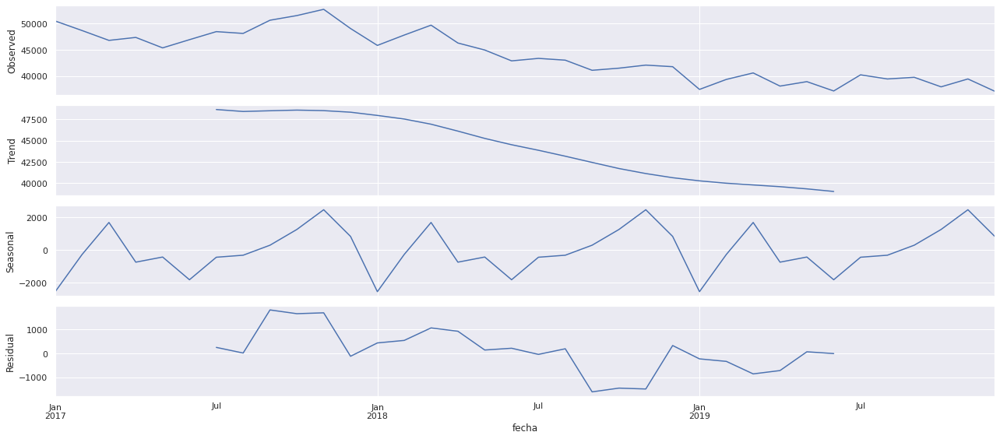

In [ ]:
from pylab import rcParams
import statsmodels.api as sm

rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(y, model='additive')
fig = decomposition.plot()
plt.show()

### Analisis Autocorrelación


In [ ]:
from statsmodels.tsa.stattools import acf
nlags =  157 #Cantidad de Retrasos
autocorr = acf(semanal.cantidad_pasos, nlags = nlags)

In [ ]:
autocorr.shape

(158,)

Text(0.5, 0, 'lag')

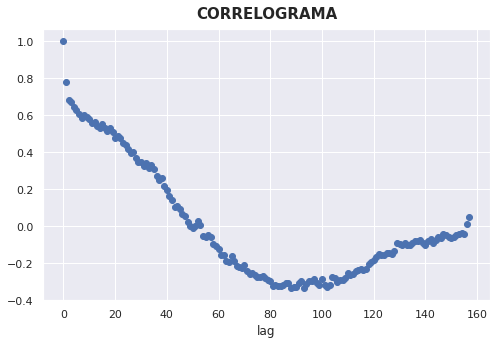

In [ ]:
plt.figure(figsize = (8,5))
plt.scatter(np.arange(nlags+1), autocorr)
plt.title("CORRELOGRAMA", pad=10, fontsize=15, fontweight="bold")
plt.xlabel('lag')

Donde obtengo mayor información es las caídas más bruscas. 


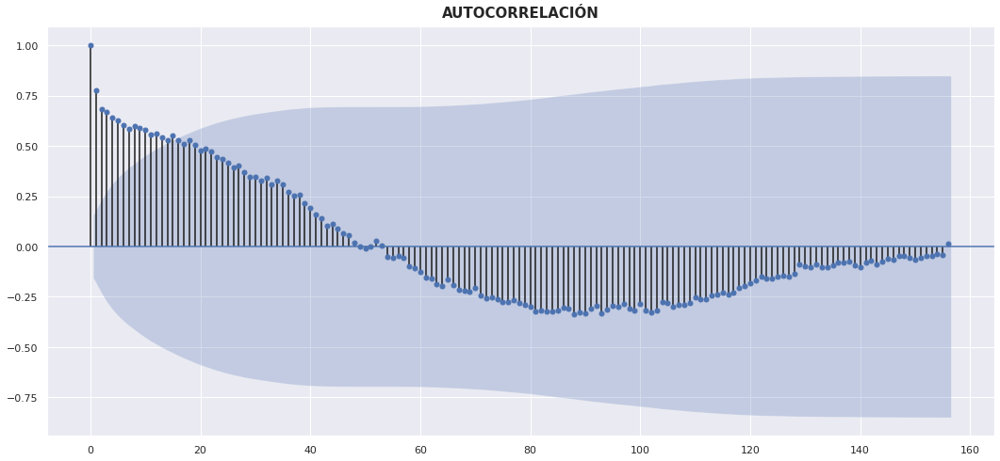

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(semanal.cantidad_pasos, lags = 156)
plt.title("AUTOCORRELACIÓN", pad=10, fontsize=15, fontweight="bold")
plt.show()

En este grafico vemos los rezagos de la serie de  tiempo y podemos analizar que tanta importancia tienen enel valor actual. Aplicado a esto indica que misvalores recientes tienen más importancia que los valores pasados.
La función de autocorrelación (acf ()) proporciona la autocorrelación en todos los retrasos posibles. La autocorrelación en el retraso 0 se incluye por defecto, lo que siempre toma el valor 1, ya que representa la correlación entre los datos y ellos mismos. Como podemos observar en el gráfico anterior, la autocorrelación continúa disminuyendo a medida que aumenta el retraso, lo que confirma que no existe una asociación lineal entre las observaciones separadas por retrasos mayores.

### Analisis de autocorrelación parcial


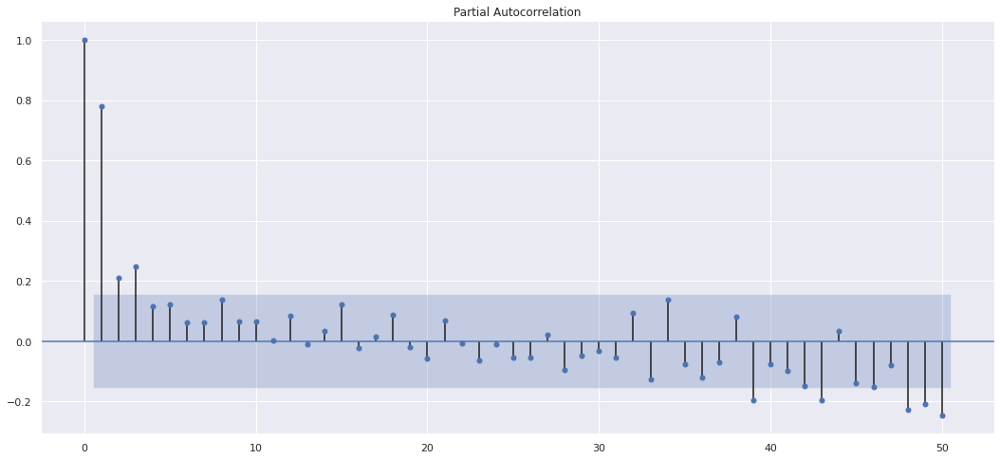

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
series = semanal.cantidad_pasos
plot_pacf(series, lags=50)
plt.show()

Describe la relación directa entre una observación y su retraso. Resume la relación entre una observación en una serie de tiempo con observaciones en pasos de tiempo anteriores al eliminar las relaciones de las observaciones intervinientes.
La autocorrelación para la observación y la observación en un paso de tiempo anterior consiste en las correlaciones directas e indirectas. Estas correlaciones indirectas consisten en una función lineal de la correlación de la observación en los pasos de tiempo intermedios. La función de autocorrelación parcial elimina estas correlaciones indirectas.


### Determinación del Tipo de Modelo Estacionario o No Estacionario

In [ ]:
from statsmodels.tsa.stattools import adfuller
import pandas as pd #Analisis de datos

def test_stationary(timeseries):

#Estadísticasde la determinaciónde balance (Media Movil y Desviación Estandár)
    rolmean= pd.rolling_mean(timeserie, window=12)
    rolstad = pd.rolling_std(timeserie, window=12)
#Graficar estadisticasde balanceo
    oring=plt.plot(timeseries, color="blue", label="Orginal")
    mean=plt.plot(rolmean, color="red", label="Media Movil")
    std=plt.plot(rolstd, color="black", label="Desviación Estandar")
    plt.legend(loc="best")
    plt.show(block="false")
    test_stationary(diario["Cantidad Pasos"])


Text(0.5, 1.0, 'Varianza Semanal')

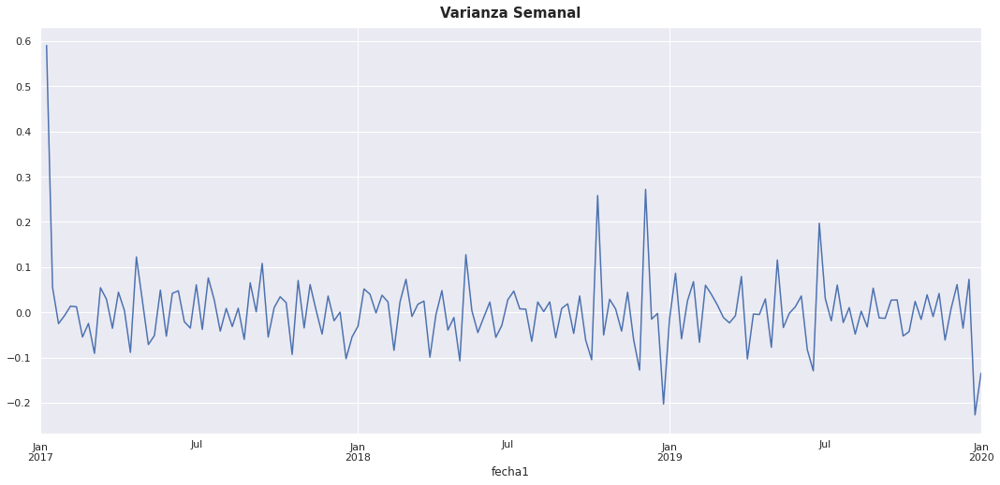

In [ ]:
#Calculo de la Varianza
variacion_semanal=semanal["cantidad_pasos"]/semanal["cantidad_pasos"].shift(1)-1
semanal["var_semanal"] = variacion_semanal
semanal["var_semanal"][:5]
#Grafico de la varianza
plot=semanal["var_semanal"].plot()
plt.title("Varianza Semanal", pad=10, fontsize=15, fontweight="bold")



### Prueba de Dicky Fuller

Prueba de Dicky Fuller que analiza si es o no estacionaria la serie, son pruebas de raíz unitaria. Trabajaremos en base a dos Hipotesis:

- Hipotesis H0 = Raiz Unitaria. La serie de tiempo no es estacionaria.
- Hipotesis H1 = No Hay Raiz Unitaria. La serie de tiempo es estacionaria.

Se espera que el estadistico ADF sea menor que el valor critico para que la hipotesis nula sea rechazada y concluir que la serie de tiempo es estacionaria.

In [ ]:
"""
Prueba de Dicky Fuller 

"""
X = diario.cantidad_pasos
ad_fuller = adfuller(X)
print('ADF Statistic: %f' % ad_fuller[0])
print('p-value: %f' % ad_fuller[1])
print('Critical Values:')
for key, value in ad_fuller[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.662833
p-value: 0.450357
Critical Values:
	1%: -3.436
	5%: -2.864
	10%: -2.568


En este caso ADF cae en el área de aceptación de la hipotesis por lo que significa que se cumple la hipotesis y la serie no es estacionaria.

### Conclusión del Análisis:

Puedo concluir que:
- La serie presentaba valores atipicos los cuales fueron debidamente trabajados.

Propiedades de la serie:
- Es una serie con tendencia negativa (Según prueba Regresión Lineal). Esto se presume que ocure por la migración de pago a modalidad sólo efectivo.
- No estacionaria (Según prueba Dicky Fuller).
- Presenta cierto grado de estacionalidad (Según prueba de descomposición).
- Presenta Ruido Blanco(Según prueba de descomposición)

## 2.4 Información adicional


Si es necesario intrerpreta con información auxiliar o elementos del datset que no estes utilizando. Por ejemplo, si la tendencia es negativa. ¿Puede ser porque migre a otras forma de pago?

### Revisando por año y tipo de modalidad de pago

Unimos los 3 datasets (3560706, 10)
Los Tipos de forma de pago son:  ['NO COBRADO' 'EFECTIVO' 'INFRACCION' 'EXENTO' 'TARJETA DISCAPACIDAD'
 'TELEPASE' 'MONEDERO' 'Otros' 'T. DISCAPACIDAD']
AxesSubplot(0.125,0.125;0.775x0.755)


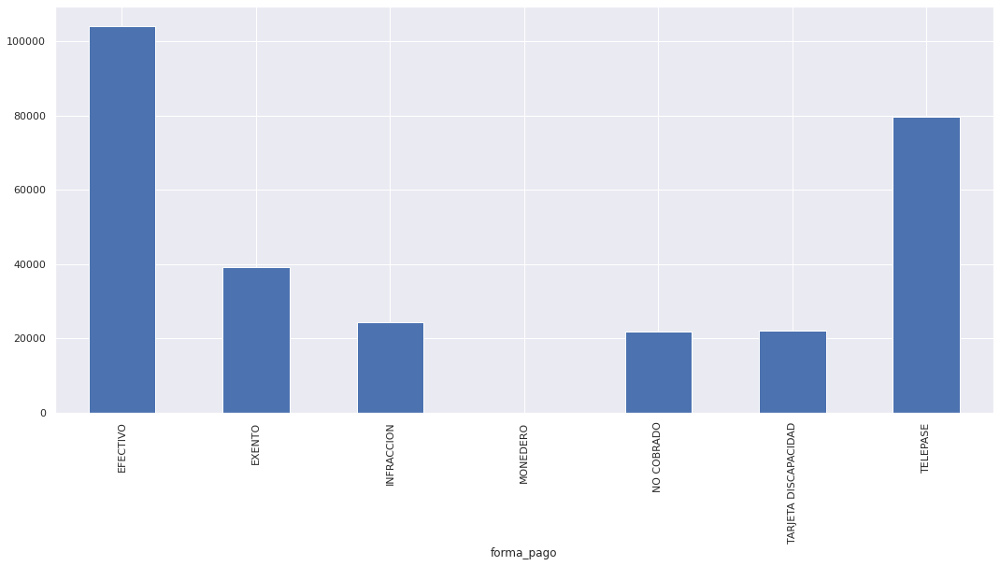

In [ ]:
#Unimos los 3 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
dataset = pd.concat([data_2019, data_2018, data_2017])
print("Unimos los 3 datasets",dataset.shape)

#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset.drop(columns=['periodo','fecha','hora_fin','hora_inicio'], inplace = True)

#Corregimos el nombre de fecha2 a fecha
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True) 

#Reordenamos el dataset por fecha
dataset.sort_values('fecha', inplace = True)
dataset.reset_index(drop=True, inplace = True)

#Quitamos las columnas que no vamos a utilizar
dataset.drop(columns = ['dia','tipo_vehiculo'], inplace = True)

print("Los Tipos de forma de pago son: ", dataset['forma_pago'].unique())
dataset

#Filtrando por estación Illia
Illia = (dataset["estacion"] == "Illia")
Illia = dataset[Illia]

#Graficando las formas de pago 2017
print(Illia2017.groupby("forma_pago")["forma_pago"].count().plot(kind="bar"))


AxesSubplot(0.125,0.125;0.775x0.755)


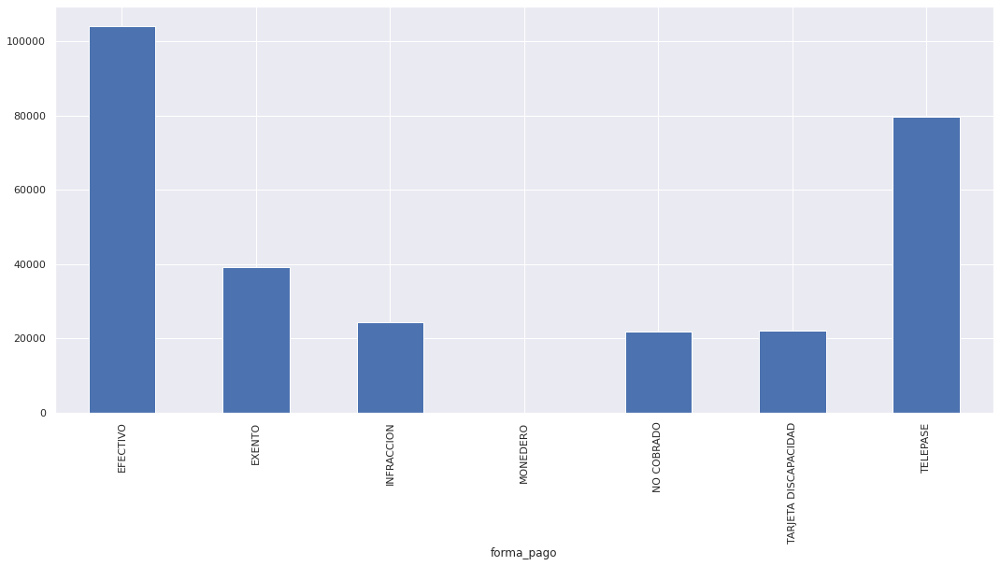

In [ ]:
#Revisando las formas de pago por año

#Aplico un filtro
from datetime import datetime
start_date2019 = datetime(2019, 1, 1)
end_date2019 = datetime(2019, 12, 31)
start_date2018 = datetime(2018, 1, 1)
end_date2018 = datetime(2018, 12, 31)
start_date2017 = datetime(2017, 1, 1)
end_date2017 = datetime(2017, 12, 31)

Illia2019 = (Illia.fecha >= start_date2019) & (Illia.fecha <= end_date2019)
Illia2018 = (Illia.fecha >= start_date2018) & (Illia.fecha <= end_date2018)
Illia2017 = (Illia.fecha >= start_date2017) & (Illia.fecha <= end_date2017)

Illia2019 = Illia[Illia2019]
Illia2018 = Illia[Illia2018]
Illia2017 = Illia[Illia2017]

#Graficando el Comportamiento de pago 2017
print(Illia2017.groupby("forma_pago")["forma_pago"].count().plot(kind="bar"))

Para el 2017 se observa que la modalidad de pago efectivo es la más popular seguida por la de "Telepase"




AxesSubplot(0.125,0.125;0.775x0.755)


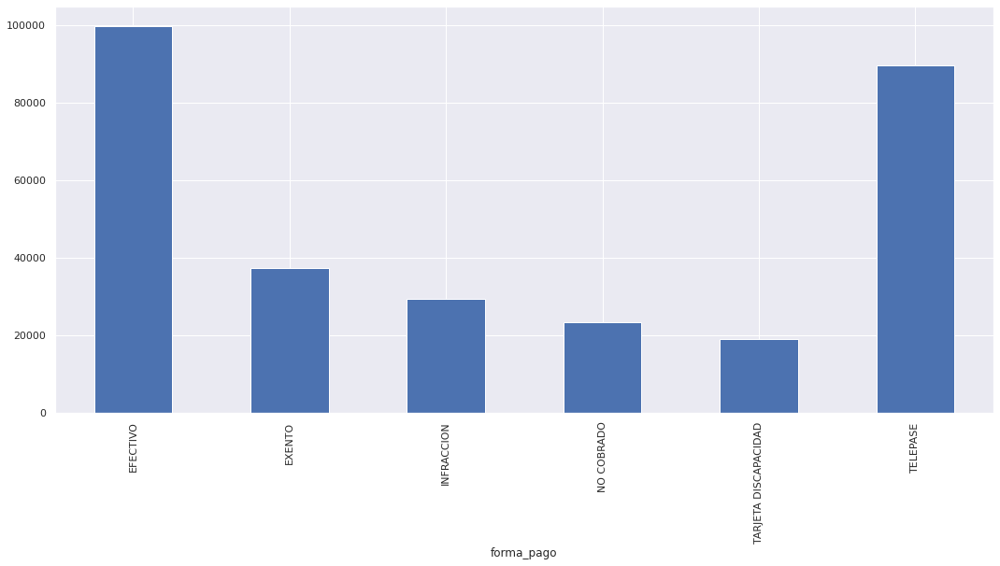

In [ ]:
#Graficando el Comportamiento de pago 2018
print(Illia2018.groupby("forma_pago")["forma_pago"].count().plot(kind="bar"))


Para el 2018 se observa que la modalidad de pago "Efectivo" es la más popular seguida por la de "Telepase". No obstante, para este periodo el "Telepase" va aumentando su uso mientras que el efectivo disminuye levemente.




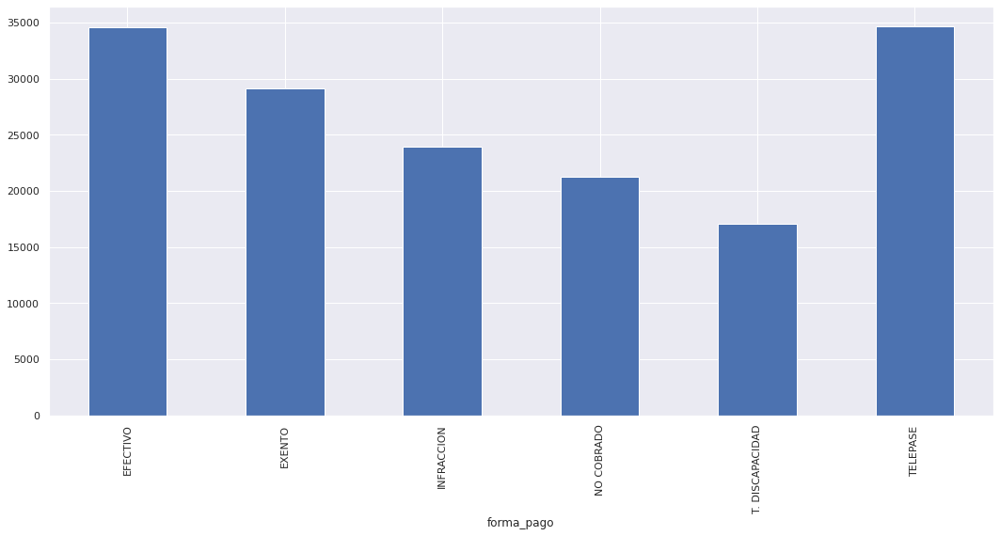

In [ ]:
#Graficando el Comportamiento de pago 2019
Illia2019.groupby("forma_pago")["forma_pago"].count().plot(kind="bar")


Para el 2019 se observa que el flujo vehicular disminuye a más de la miad respecto del año anterior.
La modalidad de pago "Efectivo" y "Telepase" son sumamente similares por lo que se podría inferir que hay un evento exogeno que provoca este comportamiento en la serie.
Observando los graficos anteriores puedo revisar que la principal baja se ve en el año 2019 por lo que lo revisaré en mayor profundidad




### Revisando por Trimestre - 2019

AxesSubplot(0.125,0.125;0.775x0.755)


,estacion,sentido,forma_pago,cantidad_pasos,fecha
2748577,Illia,Provincia,TELEPASE,15,2019-01-01
2748578,Illia,Centro,EXENTO,8,2019-01-01
2748588,Illia,Provincia,EXENTO,1,2019-01-01
2748589,Illia,Provincia,EFECTIVO,9,2019-01-01
2748590,Illia,Centro,EFECTIVO,644,2019-01-01
...,...,...,...,...,...
3004387,Illia,Centro,NO COBRADO,7,2019-04-30
3004391,Illia,Centro,TELEPASE,312,2019-04-30
3004409,Illia,Centro,INFRACCION,2,2019-04-30
3004410,Illia,Centro,EXENTO,5,2019-04-30


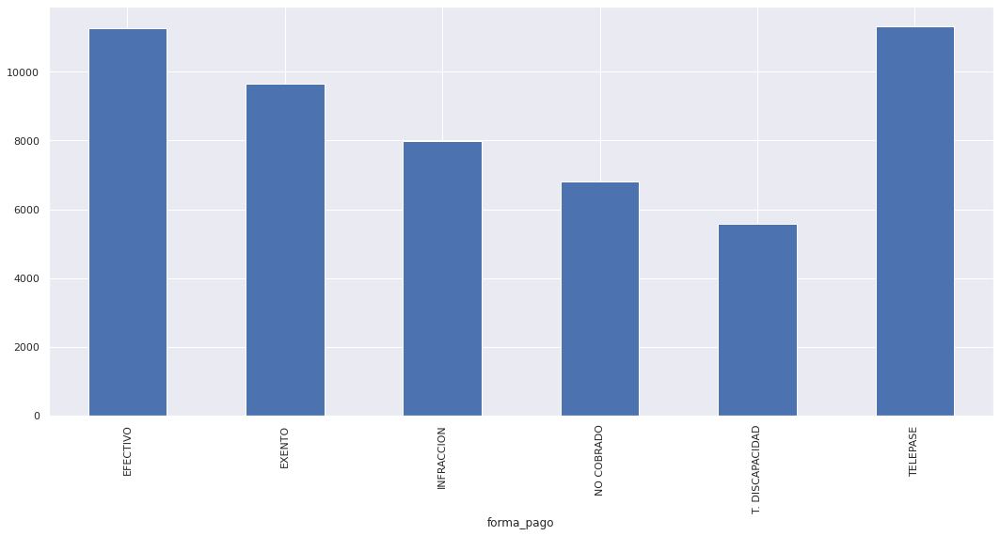

In [ ]:
#Revisando las formas de pago por rimestre para el año 2019

#Aplico un filtro para separar trimestralmente el 2019
from datetime import datetime
start_datea = datetime(2019, 1, 1)
end_datea = datetime(2019, 4, 30)
start_dateb = datetime(2019, 5, 1)
end_dateb = datetime(2019, 8, 31)
start_datec = datetime(2019, 9, 1)
end_datec = datetime(2019, 12, 31)

trimestre1 = (Illia2019.fecha >= start_datea) & (Illia2019.fecha <= end_datea)
trimestre2 = (Illia2019.fecha >= start_dateb) & (Illia2019.fecha <= end_dateb)
trimestre3 = (Illia2019.fecha >= start_datec) & (Illia2019.fecha <= end_datec)

trimestre1 = Illia2019[trimestre1]
trimestre2 = Illia2019[trimestre2]
trimestre3 = Illia2019[trimestre3]


#Graficando el Comportamiento de pago 2019
print(trimestre1.groupby("forma_pago")["forma_pago"].count().plot(kind="bar"))
trimestre1

AxesSubplot(0.125,0.125;0.775x0.755)


,estacion,sentido,forma_pago,cantidad_pasos,fecha
3006460,Illia,Provincia,TELEPASE,19,2019-05-01
3006461,Illia,Provincia,EFECTIVO,498,2019-05-01
3006462,Illia,Provincia,EFECTIVO,7,2019-05-01
3006480,Illia,Provincia,EXENTO,1,2019-05-01
3006483,Illia,Provincia,TELEPASE,366,2019-05-01
...,...,...,...,...,...
3278214,Illia,Provincia,EFECTIVO,3,2019-08-31
3278215,Illia,Provincia,EXENTO,1,2019-08-31
3278234,Illia,Provincia,TELEPASE,5,2019-08-31
3278235,Illia,Provincia,NO COBRADO,1,2019-08-31


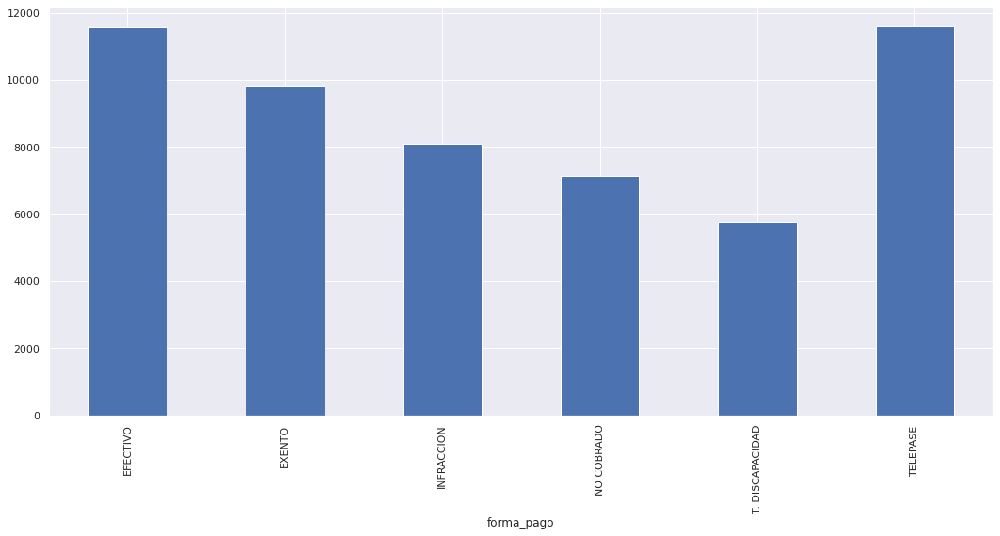

In [ ]:
print(trimestre2.groupby("forma_pago")["forma_pago"].count().plot(kind="bar"))
trimestre2

AxesSubplot(0.125,0.125;0.775x0.755)


,estacion,sentido,forma_pago,cantidad_pasos,fecha
3280477,Illia,Provincia,TELEPASE,349,2019-09-01
3280478,Illia,Provincia,TELEPASE,14,2019-09-01
3280479,Illia,Provincia,EXENTO,2,2019-09-01
3280481,Illia,Provincia,EFECTIVO,7,2019-09-01
3280482,Illia,Provincia,INFRACCION,3,2019-09-01
...,...,...,...,...,...
3558639,Illia,Centro,TELEPASE,2,2019-12-31
3558640,Illia,Centro,TELEPASE,39,2019-12-31
3558641,Illia,Centro,NO COBRADO,163,2019-12-31
3558642,Illia,Centro,EFECTIVO,4,2019-12-31


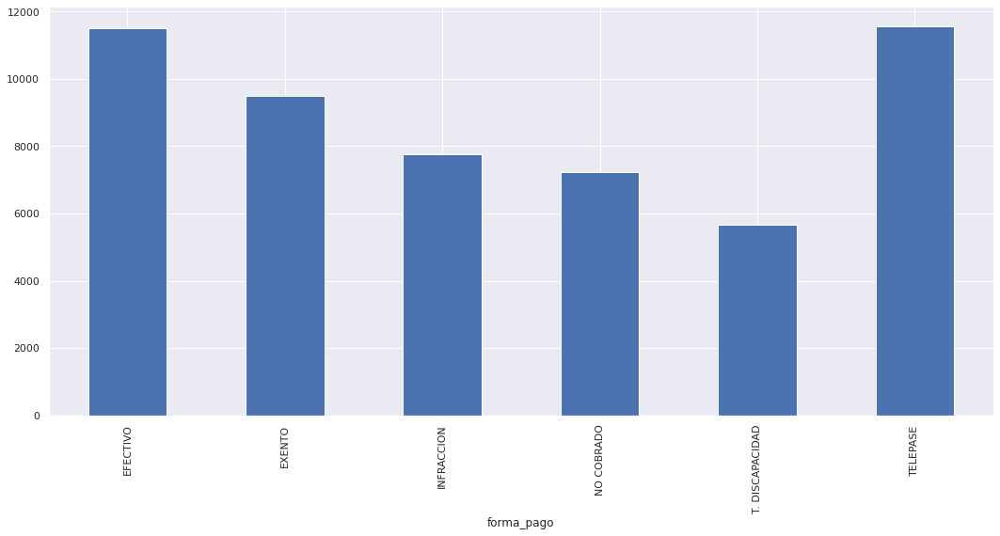

In [ ]:
print(trimestre3.groupby("forma_pago")["forma_pago"].count().plot(kind="bar"))
trimestre3

### Conclusión

In [ ]:
print("Los Tipos de forma de pago son: ", Illia['forma_pago'].unique())


Los Tipos de forma de pago son:  ['EFECTIVO' 'NO COBRADO' 'TELEPASE' 'EXENTO' 'TARJETA DISCAPACIDAD'
 'INFRACCION' 'MONEDERO' 'T. DISCAPACIDAD']


In [ ]:
Illia

,estacion,sentido,forma_pago,cantidad_pasos,fecha
1,Illia,Provincia,EFECTIVO,9,2017-01-01 00:00:00
2,Illia,Provincia,NO COBRADO,3,2017-01-01 00:00:00
21,Illia,Centro,TELEPASE,1,2017-01-01 00:00:00
22,Illia,Provincia,EXENTO,2,2017-01-01 00:00:00
23,Illia,Provincia,EFECTIVO,644,2017-01-01 00:00:00
...,...,...,...,...,...
3560696,Illia,Centro,TELEPASE,122,2019-12-31 23:00:00
3560697,Illia,Centro,NO COBRADO,3,2019-12-31 23:00:00
3560698,Illia,Centro,INFRACCION,4,2019-12-31 23:00:00
3560699,Illia,Centro,EXENTO,1,2019-12-31 23:00:00


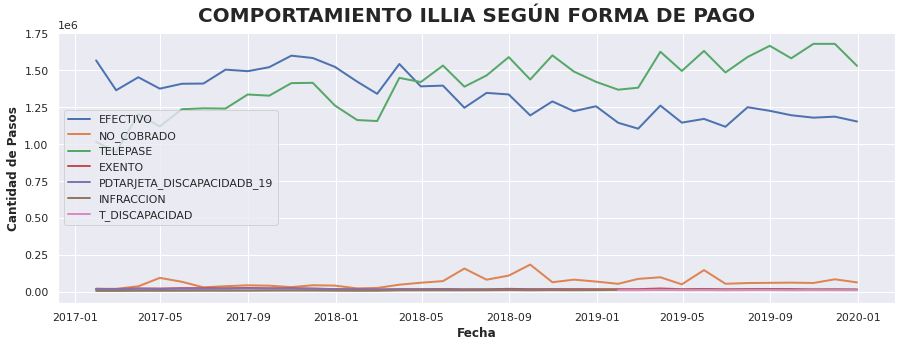

In [ ]:
#Filtrando por Sentido Centro
#Illia.drop(columns = ["estacion",'forma_pago'], inplace = True)

Illia.set_index('fecha', inplace=True)

# Filtrando por Forma de Pago
EFECTIVO = (Illia["forma_pago"] == "EFECTIVO")
NO_COBRADO = (Illia["forma_pago"] == "NO COBRADO")
TELEPASE = (Illia["forma_pago"] == "TELEPASE")
EXENTO = (Illia["forma_pago"] == "EXENTO")
TARJETA_DISCAPACIDAD = (Illia["forma_pago"] == "TARJETA DISCAPACIDAD")
INFRACCION = (Illia["forma_pago"] == "INFRACCION")
T_DISCAPACIDAD = (Illia["forma_pago"] == "T. DISCAPACIDAD")

EFECTIVO = Illia[EFECTIVO]
NO_COBRADO = Illia[NO_COBRADO]
TELEPASE = Illia[TELEPASE]
EXENTO = Illia[EXENTO]
TARJETA_DISCAPACIDAD = Illia[TARJETA_DISCAPACIDAD]
INFRACCION = Illia[INFRACCION]
T_DISCAPACIDAD = Illia[T_DISCAPACIDAD]

#Resampleando
EFECTIVO = EFECTIVO.resample('M').sum()
NO_COBRADO = NO_COBRADO.resample('M').sum()
TELEPASE = TELEPASE.resample('M').sum()
EXENTO = EXENTO.resample('M').sum()
TARJETA_DISCAPACIDAD = TARJETA_DISCAPACIDAD.resample('M').sum()
INFRACCION = INFRACCION.resample('M').sum()
T_DISCAPACIDAD = T_DISCAPACIDAD.resample('M').sum()

#Graficando
plt.figure(figsize = (15,5))
plt.plot(EFECTIVO.cantidad_pasos, label = 'EFECTIVO', lw=2,linestyle="-")
plt.plot(NO_COBRADO.cantidad_pasos, label = 'NO_COBRADO', lw=2,linestyle="-")
plt.plot(TELEPASE.cantidad_pasos, label = 'TELEPASE', lw=2,linestyle="-")
plt.plot(EXENTO.cantidad_pasos, label = 'EXENTO', lw=2,linestyle="-")
plt.plot(TARJETA_DISCAPACIDAD.cantidad_pasos, label = 'PDTARJETA_DISCAPACIDADB_19', lw=2,linestyle="-")
plt.plot(INFRACCION.cantidad_pasos, label = 'INFRACCION', lw=2,linestyle="-")
plt.plot(T_DISCAPACIDAD.cantidad_pasos, label = 'T_DISCAPACIDAD', lw=2,linestyle="-")
plt.legend()
plt.title("COMPORTAMIENTO ILLIA SEGÚN FORMA DE PAGO",pad=10, fontweight="bold", fontsize=20)

plt.xlabel('Fecha', fontweight="bold")
plt.ylabel('Cantidad de Pasos', fontweight="bold")
#plt.ylim(-10,40)
plt.show()


Al analizar la autopista Illia según la forma de pago por todos los periodos se oserva que en mayo del 2018 ocurre un quiebre en la tendencia al alza de efectivo, no necesariamente porque el flujo disminuya si no que se reducen los cobros en efectivo y aumentan los cobros por Telepase lo que nos habla de que la form de pago migra a "Telepase" muy probablemente por un evento exogeno o los cambios culturales en modalidad de pago que se viven hoy en día, donde el efectivo va quedando obsoleto.
Si quisiera predecir el flujo total de la autopista lo ideal sería tomar ambas variables ya que el cobro en efectivo baja y el cobro por telepase sube.

# 3.- Predicción a Futuro

## 3.1.- Métodos clásicos de predicción de series de tiempo en Python

In [ ]:
# Traigo el dataset
data = diario.drop(['fecha1'],axis=1)
#np.asarray (data)
data

,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486
...,...
2019-12-27,40182
2019-12-28,30681
2019-12-29,26259


### Autorregresión (AR)
El método de autorregresión (AR) modela el siguiente paso en la secuencia como una función lineal de las observaciones en los pasos de tiempo anteriores.
La notación para el modelo implica especificar el orden del modelo p como un parámetro de la función AR, por ejemplo, AR (p). Por ejemplo, AR (1) es un modelo de autorregresión de primer orden.

USO: El método es adecuado para series de tiempo univariadas sin tendencia ni componentes estacionales.

In [ ]:
#pip uninstall statsmodels


In [ ]:
#pip install numpy scipy patsy pandas


In [ ]:
#pip install statsmodels --upgrade

In [ ]:
#pip install pytest --upgrade

In [ ]:
import statsmodels.api as sm
#from statsmodels.tsa.ar_model import AutoReg


In [ ]:
# AR
#from statsmodels.tsa.ar_model import AutoReg
# Creo el Modelo
#model = AutoReg(data, lags=2)
# Entreno el Modelo
#model_fit = model.fit()
# Hago la predicción
#y_Ar = model_fit.predict(len(data), len(data))
#print(y_Ar)

### Media móvil (MA)
El método de la media móvil (MA) modela el siguiente paso de la secuencia como una función lineal de los errores residuales de un proceso medio en los pasos de tiempo anteriores.
Un modelo de media móvil es diferente de calcular la media móvil de la serie temporal.
La notación para el modelo implica especificar el orden del modelo que como un parámetro de la función MA, por ejemplo MA (q). 
Por ejemplo, MA (1) es un modelo de promedio móvil de primer orden.

USO: El método es adecuado para series de tiempo univariadas sin tendencia ni componentes estacionales, siempre deben ser estacionares. Pese a que este no sea el caso la probaré para revisar el comportamiento.

Código Python:Usaré clase ARIMA para crear un modelo MA y establecer un modelo AR de orden cero. Se debe especificar el orden del modelo MA en el argumento de orden.

In [ ]:
# MA
from statsmodels.tsa.arima_model import ARIMA
# Traigo el dataset
# Creo el Modelo
model = ARIMA(data, order=(0, 0, 1))#Acá sólo activo la parte de MA (Ar=0, I=0, Ma=1)
# Entreno el Modelo
model_fit = model.fit()
# Hago la predicción
y_Ma = model_fit.predict(len(data), len(data))
print(y_Ma)

1088    33631.981436
dtype: float64


### Media móvil autorregresiva (ARMA)
El método de media móvil autorregresiva (ARMA) modela el siguiente paso de la secuencia como una función lineal de las observaciones y los errores residuales en los pasos de tiempo anteriores.
Combina los modelos de autorregresión (AR) y de media móvil (MA).
La notación para el modelo implica especificar el orden de los modelos AR (p) y MA (q) como parámetros para una función ARMA, por ejemplo, ARMA (p, q). Se puede utilizar un modelo ARIMA para desarrollar modelos AR o MA.

- USO: El método es adecuado para series de tiempo univariadas sin tendencia ni componentes estacionales.

- Código Python: Usaré clase ARIMA para crear un modelo MA y establecer un modelo AR de orden cero. Se debe especificar el orden del modelo MA en el argumento de orden.

In [ ]:
# ARMA 
# Traigo el dataset
# Creo el Modelo
model = ARIMA(data, order=(2, 0, 1))#Acá sólo activo la parte de AR y MA (Ar=1, I=0, Ma=1)
# Entreno el Modelo
model_fit = model.fit()
# Hago la predicción
y_Arma = model_fit.predict(len(data), len(data))
print(y_Arma)

1088    32670.723457
dtype: float64


### Media móvil integrada autorregresiva (ARIMA)
El método de media móvil integrada autorregresiva (ARIMA) modela el siguiente paso de la secuencia como una función lineal de las observaciones diferenciadas y los errores residuales en los pasos de tiempo anteriores.

Combina los modelos de autorregresión (AR) y de media móvil (MA), así como un paso de preprocesamiento de diferenciación de la secuencia para hacer que la secuencia sea estacionaria, llamado integración (I).

La notación para el modelo implica especificar el orden de los modelos AR (p), I (d) y MA (q) como parámetros para una función ARIMA, por ejemplo, ARIMA (p, d, q). Un modelo ARIMA también se puede utilizar para desarrollar modelos AR, MA y ARMA.

- USO: El método es adecuado para series de tiempo univariadas con tendencia y sin componentes estacionales.
En este caso el modelo tiene una tendencia por lo que calza con el primer punto, no obstante sí tiene componente estacional a diferencia de lo indicado en el detalle del modelo.



In [ ]:
# ARIMA 

# Traigo el dataset
# Creo el Modelo
model = ARIMA(data, order=(1, 1, 1))#Acá activo el modelo completo (Ar=1, I=1, Ma=1)
# Entreno el Modelo
model_fit = model.fit()
# Hago la predicción
y_Arima = model_fit.predict(len(data), len(data), typ='levels')
print(y_Arima)

1087    32426.715941
dtype: float64


### Media móvil integrada autorregresiva estacional (SARIMA)

El método de Media Móvil Estacional Autoregresiva Integrada (SARIMA) modela el siguiente paso en la secuencia como una función lineal de las observaciones diferenciadas, errores, observaciones estacionales diferenciadas y errores estacionales en pasos de tiempo anteriores.

Combina el modelo ARIMA con la capacidad de realizar la misma autorregresión, diferenciación y modelado de media móvil a nivel estacional.

La notación para el modelo implica especificar el orden de los modelos AR (p), I (d) y MA (q) como parámetros para una función ARIMA y AR (P), I (D), MA (Q) y m parámetros a nivel estacional, por ejemplo, SARIMA (p, d, q) (P, D, Q) m donde “m” es el número de pasos de tiempo en cada temporada (el período estacional). Se puede utilizar un modelo SARIMA para desarrollar modelos AR, MA, ARMA y ARIMA.

- USO: Series de tiempo univariadas con tendencias y / o componentes estacionales. Este metodo se encaja a lo necesario para poder realizar una buena predicción del modelo.

In [ ]:
# SARIMA 
from statsmodels.tsa.statespace.sarimax import SARIMAX
# Traigo el dataset
# Creo el Modelo
model = SARIMAX(data, order=(1, 1, 1), seasonal_order=(0, 0, 0, 0))
# Entreno el Modelo
model_fit = model.fit(disp=False)
# Hago la predicción
y_Sarimax = model_fit.predict(len(data), len(data))
print(y_Sarimax)

1088    32243.461802
dtype: float64


### Autorregresión vectorial (VAR)
El método de autorregresión vectorial (VAR) modela el siguiente paso en cada serie de tiempo utilizando un modelo AR. Es la generalización de AR a múltiples series de tiempo paralelas, por ejemplo, series de tiempo multivariadas.
La notación para el modelo implica especificar el orden para el modelo AR (p) como parámetros para una función VAR, por ejemplo, VAR (p).
El método es adecuado para series de tiempo multivariadas sin tendencia ni componentes estacionales.
No aplicaria para este modelo ya que es univariable

### Suavizado exponencial simple (SES)
El método de suavizado exponencial simple (SES) modela el siguiente paso de tiempo como una función lineal ponderada exponencialmente de las observaciones en los pasos de tiempo anteriores.
El método es adecuado para series de tiempo univariadas sin tendencia ni componentes estacionales.

In [ ]:
# SES 
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
# Traigo el dataset
# Creo el Modelo
model = SimpleExpSmoothing(data)
# Entreno el Modelo
model_fit = model.fit()
# Hago la predicción
y_Ses = model_fit.predict(len(data), len(data))
print(y_Ses)

1088    36367.79044
dtype: float64


### Suavizado exponencial de Holt Winter (HWES)
El suavizado exponencial de Holt Winter (HWES) también llamado el método de suavizado exponencial triple modela el siguiente paso de tiempo como una función lineal ponderada exponencialmente de observaciones en pasos de tiempo anteriores, teniendo en cuenta las tendencias y la estacionalidad.

El método es adecuado para series de tiempo univariadas con tendencias y / o componentes estacionales.

In [ ]:
# HWES 
from statsmodels.tsa.holtwinters import ExponentialSmoothing
# Traigo el dataset
# Creo el Modelo
model = ExponentialSmoothing(data)
# Entreno el Modelo
model_fit = model.fit()
# Hago la predicción
y_Hwes = model_fit.predict(len(data), len(data))
print(y_Hwes)

1088    36367.79044
dtype: float64


### Benchmark RMSE

In [ ]:
models = [
           ('(MA)Media móvil', y_Ma),
#          ('(AR)Autorregresión', y_Ar),
           ("(ARMA)Media móvil autorregresiva", y_Arma),
           ('(ARIMA)Media móvil integrada autorregresiva', y_Arima),
           ('(SARIMA) Media móvil integrada autorregresiva estacional', y_Sarimax),
           ('(SES)Suavizado exponencial simple', y_Ses),
           ('(HWES)Suavizado exponencial de Holt Winter', y_Hwes)]

predict = pd.DataFrame(data = models, columns=['Modelo','Nº-Predicción-TipoDato'])
predict

,Modelo,Nº-Predicción-TipoDato
0,(MA)Media móvil,1088 33631.981436 dtype: float64
1,(ARMA)Media móvil autorregresiva,1088 32670.723457 dtype: float64
2,(ARIMA)Media móvil integrada autorregresiva,1087 32426.715941 dtype: float64
3,(SARIMA) Media móvil integrada autorregresiva ...,1088 32243.461802 dtype: float64
4,(SES)Suavizado exponencial simple,1088 36367.79044 dtype: float64
5,(HWES)Suavizado exponencial de Holt Winter,1088 36367.79044 dtype: float64


Como los mejores resultados obtenidos se observan en ARMA - ARIMA - SARIMA, exploraré en mayor profundidad dichos modelos

## 3.2.- ARIMA

Bibliografia: https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/´

### Transformaciones de datos.

Modelo de media móvil integrado autorregresivo. Un modelo ARIMA es una clase de modelo estadístico para analizar y pronosticar datos de series de tiempo.
Atiende explícitamente a un conjunto de estructuras estándar en datos de series de tiempo y, como tal, proporciona un método simple pero poderoso para realizar pronósticos hábiles de series de tiempo.

ARIMA es un acrónimo de AutoRegressive Integrated Moving Average. Es una generalización de la media móvil autorregresiva más simple y agrega la noción de integración.
Este acrónimo es descriptivo y captura los aspectos clave del modelo en sí. Brevemente, son:
- AR : Autoregresión . Un modelo que utiliza la relación dependiente entre una observación y cierto número de observaciones retrasadas.
- I : Integrado . El uso de la diferenciación de observaciones en bruto (por ejemplo, restando una observación de una observación en el paso de tiempo anterior) para hacer estacionaria la serie de tiempo.
- MA : Media móvil . Modelo que utiliza la dependencia entre una observación y un error residual de un modelo de promedio móvil aplicado a observaciones retrasadas.

Cada uno de estos componentes se especifica explícitamente en el modelo como parámetro. Se utiliza una notación estándar de ARIMA (p, d, q) donde los parámetros se sustituyen por valores enteros para indicar rápidamente el modelo ARIMA específico que se está utilizando.

Los parámetros del modelo ARIMA se definen de la siguiente manera:

- p : El número de observaciones de retraso incluidas en el modelo, también llamado orden de retraso.
- d : El número de veces que se diferencian las observaciones sin procesar, también llamado grado de diferenciación.
- q : El tamaño de la ventana de media móvil, también llamado orden de media móvil.
Se construye un modelo de regresión lineal que incluye el número y el tipo de términos especificados, y los datos se preparan mediante un grado de diferenciación para hacerlos estacionarios, es decir, para eliminar las estructuras de tendencia y estacionales que afectan negativamente al modelo de regresión.

Se puede usar un valor de 0 para un parámetro, lo que indica no usar ese elemento del modelo. De esta manera, el modelo ARIMA se puede configurar para realizar la función de un modelo ARMA, e incluso un modelo simple AR, I o MA.
La adopción de un modelo ARIMA para una serie de tiempo supone que el proceso subyacente que generó las observaciones es un proceso ARIMA. Esto puede parecer obvio, pero ayuda a motivar la necesidad de confirmar los supuestos del modelo en las observaciones sin procesar y en los errores residuales de los pronósticos del modelo.


A REALIZAR:
- Sobre el modelo ARIMA los parámetros utilizados y los supuestos realizados por el modelo.
- Cómo ajustar un modelo ARIMA a los datos y usarlo para hacer pronósticos.
- Cómo configurar el modelo ARIMA en su problema de serie temporal.

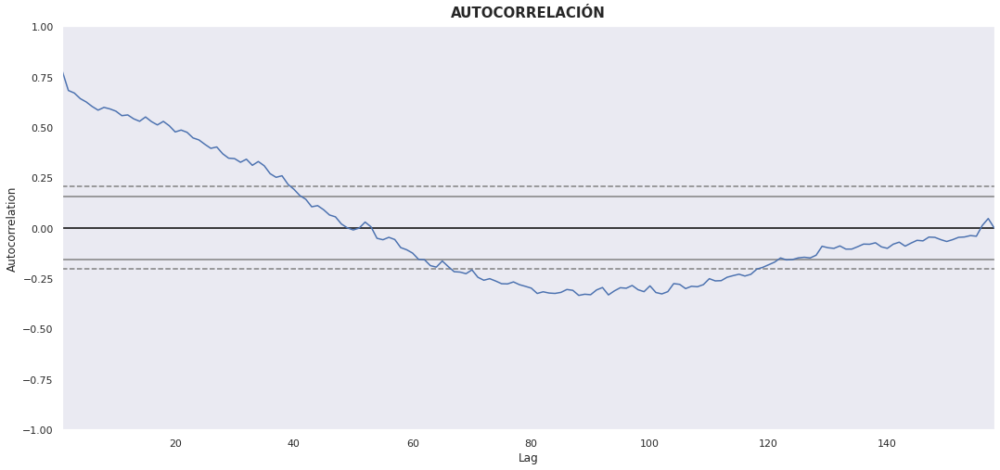

In [ ]:
from pandas import datetime
from matplotlib import pyplot
from pandas.plotting import autocorrelation_plot

"""
Echemos un vistazo rápido a un gráfico de autocorrelación de la serie de tiempo. 
Esto está integrado en Pandas. 
El siguiente ejemplo traza la autocorrelación de un gran número de rezagos en la serie temporal.

"""
series = semanal.cantidad_pasos
autocorrelation_plot(series)
pyplot.title("AUTOCORRELACIÓN", pad=10, fontsize=15, fontweight="bold")
pyplot.show()

Ejecutando podemos ver que existe una correlación positiva con los primeros rezagos de 50 a 52 apróximadamente que quizás sea significativa para los primeros 20 rezagos.
Un buen punto de partida para el parámetro AR del modelo puede ser 20.




### ARIMA con Python
Se puede crear un modelo ARIMA usando la biblioteca statsmodels de la siguiente manera:
- Se define el modelo llamando a ARIMA () y pasando los parámetros p , d y q .
- El modelo se prepara con los datos de entrenamiento llamando a la función fit ().
- Se pueden hacer predicciones llamando a la función predict () y especificando el índice del tiempo o tiempos que se van a predecir.


Comenzaré con algo simple, ajustando un modelo ARIMA a todo el conjunto de datos de Cantidad de Pasos y revisaremos los errores residuales.

Primero, ajustamos un modelo ARIMA (20,1,0). Esto establece el valor de retraso en 20 para la autorregresión, usa un orden de diferencia de 1 para hacer que la serie de tiempo sea estacionaria y usa un modelo de promedio móvil de 0.

La serie tiene una tendencia a la baja. Esto sugiere que la serie de tiempo no es estacionaria y requerirá diferenciar para hacerla estacionaria, al menos un orden de diferencia de 1.


In [ ]:
series = diario.cantidad_pasos
series.shape

(1088,)

                              ARMA Model Results                              
Dep. Variable:         cantidad_pasos   No. Observations:                 1088
Model:                    ARMA(20, 0)   Log Likelihood              -10820.699
Method:                       css-mle   S.D. of innovations           5037.889
Date:                Sat, 27 Mar 2021   AIC                          21685.397
Time:                        20:45:17   BIC                          21795.224
Sample:                             0   HQIC                         21726.968
                                                                              
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  4.398e+04   2250.209     19.544      0.000    3.96e+04    4.84e+04
ar.L1.cantidad_pasos      0.2881      0.030      9.492      0.000       0.229       0.348
ar.L2.ca

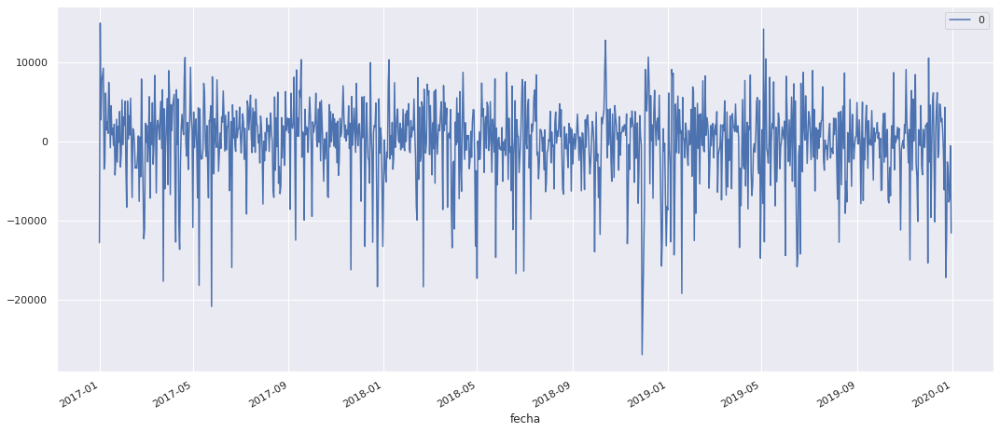

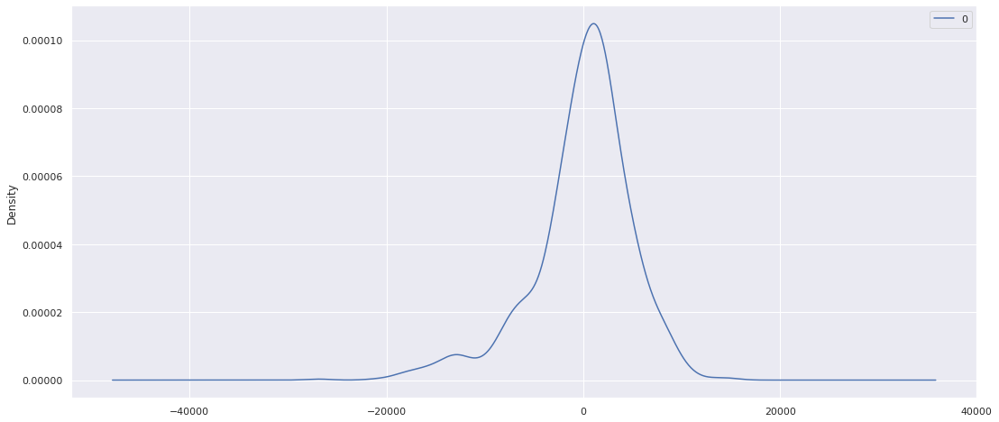

                  0
count   1088.000000
mean     -78.390164
std     5064.259058
min   -26928.710325
25%    -2230.597693
50%      626.799751
75%     2875.608741
max    14906.475826


In [ ]:
# Ajustando un modelo ARIMA y graficar errores residuales
from pandas import datetime
from pandas import DataFrame
import statsmodels
#from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot
# Traigo el Dataset
# Creo el modelo
model = ARIMA(data, order=(20,0,0))
# Entreno el modelo
model_fit = model.fit()
# Resumen del modelo de ajuste
print(model_fit.summary())
# Gráfico de líneas de residuos
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# Gráfico de densidad de residuos
residuals.plot(kind='kde')
pyplot.show()
# Resumen de estadísticas de residuos
print(residuals.describe())

- En el primer grafico, obtenemos la líneas de los errores residuales, lo que sugiere que aún puede haber información de tendencias que el modelo no captura.

- En el segundo grafico, obtenemos una gráfica de densidad de los valores de error residual, lo que sugiere que los errores son gaussianos, pero que pueden no estar centrados en cero.

Se muestra la distribución de los errores residuales. Los resultados muestran que efectivamente existe un sesgo en la predicción (una media distinta de cero en los residuos).
Aunque anteriormente usamos el conjunto de datos completo para el análisis de series de tiempo, lo ideal sería realizar este análisis solo en el conjunto de datos de entrenamiento al desarrollar un modelo predictivo.

### Modelo ARIMA de pronóstico rodante


predicted=37566.745398, expected=29139.000000
predicted=37999.286382, expected=44624.000000
predicted=48038.281819, expected=45929.000000
predicted=43480.676368, expected=47832.000000
predicted=41034.740847, expected=35446.000000
predicted=31565.528180, expected=21559.000000
predicted=25656.280445, expected=22599.000000
predicted=34589.957322, expected=27038.000000
predicted=35305.521413, expected=47080.000000
predicted=46960.541270, expected=46194.000000
predicted=39330.187512, expected=42887.000000
predicted=32593.277683, expected=25650.000000
predicted=25015.719254, expected=35546.000000
predicted=33157.704468, expected=39580.000000
predicted=42521.928480, expected=44266.000000
predicted=43571.944704, expected=31199.000000
predicted=36519.416328, expected=34330.000000
predicted=31577.617269, expected=45439.000000
predicted=41475.872411, expected=35187.000000
predicted=34800.566842, expected=39057.000000
predicted=42561.583800, expected=34062.000000
predicted=33175.709991, expected=4

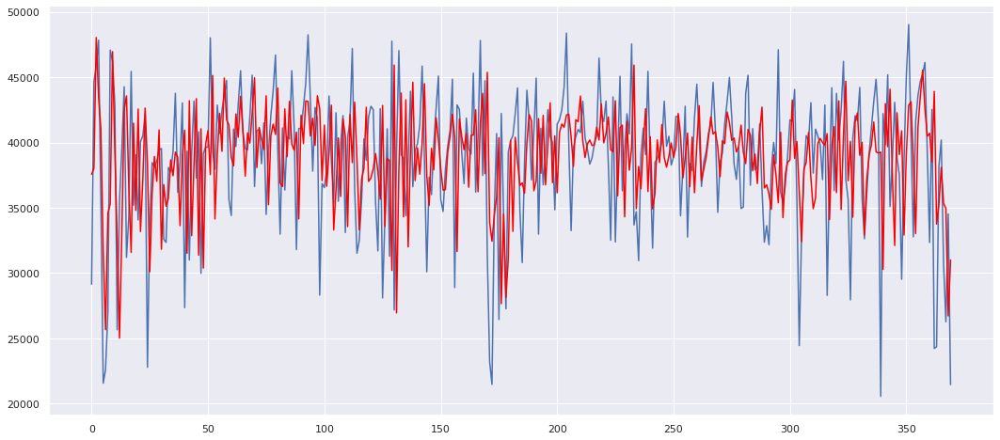

In [ ]:
# Evaluar un modelo ARIMA usando una validación de avance
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from math import sqrt

# Traigo los Datos
# split into train and test sets
series.index = series.index.to_period('D')
# split into train and test sets
X = series.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(20,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

Se crea un gráfico de líneas que muestra los valores esperados (azul) en comparación con las predicciones de pronóstico continuo (rojo). Podemos ver que los valores muestran alguna tendencia y están en la escala correcta.

### Configuración de un modelo ARIMA
Bibliografia: https://machinelearningmastery.com/grid-search-arima-hyperparameters-with-python/

El enfoque clásico para ajustar un modelo ARIMA es seguir la Metodología Box-Jenkins . Este es un proceso que utiliza análisis y diagnósticos de series de tiempo para descubrir buenos parámetros para el modelo ARIMA.
Los pasos de este proceso son los siguientes:

- Identificación del modelo . Utilice gráficos y estadísticas resumidas para identificar tendencias, estacionalidad y elementos de autorregresión para tener una idea de la cantidad de diferenciación y el tamaño del retraso que se requerirá.
- Estimación de parámetros . Utilice un procedimiento de ajuste para encontrar los coeficientes del modelo de regresión.
- Comprobación del modelo . Utilice gráficos y pruebas estadísticas de los errores residuales para determinar la cantidad y el tipo de estructura temporal no capturada por el modelo.

El proceso se repite hasta que se logre un nivel deseable de ajuste en las observaciones dentro o fuera de la muestra (por ejemplo, entrenamiento o conjuntos de datos de prueba).
Dado que el modelo se puede ajustar de manera eficiente en conjuntos de datos de series de tiempo de tamaño modesto, los parámetros de búsqueda de cuadrícula del modelo pueden ser un enfoque valioso.

El modelo ARIMA para el análisis y la previsión de series de tiempo puede ser complicado de configurar. Hay 3 parámetros que requieren una estimación por ensayo y error iterativos a partir de la revisión de gráficos de diagnóstico y el uso de reglas heurísticas.
Podemos automatizar el proceso de evaluación de una gran cantidad de hiperparámetros para el modelo ARIMA mediante un procedimiento de búsqueda de cuadrícula. Por lo que:
- Desarrollaré un procedimiento general que se puede utilizar para ajustar los hiperparámetros ARIMA para un pronóstico continuo de un paso.
- Aplicaré la optimización de hiperparámetros ARIMA en un conjunto de datos de series de tiempo univariante.
- Ideas para ampliar el procedimiento a modelos más elaborados y robustos.



**Evaluación del modelo ARIMA** 

Podemos evaluar un modelo ARIMA preparándolo en un conjunto de datos de entrenamiento y evaluando predicciones en un conjunto de datos de prueba.

Este enfoque implica los siguientes pasos:

- Dvidir el conjunto de datos en conjuntos de entrenamiento y de prueba.
- Seguir los pasos de tiempo en el conjunto de datos de prueba.
    - Entrenar un modelo ARIMA.
    - Realizar predicción de un paso.
    - Predicción; obtener y almacenar la observación real.
- Calcular la puntuación de error para las predicciones en comparación con los valores esperados.

Podemos implementar esto en Python como una nueva función independiente llamada evalu_arima_model () que toma un conjunto de datos de series de tiempo como entrada, así como una tupla con los parámetros p , d y q para el modelo que se va a evaluar.
El conjunto de datos se divide en dos: 
- 66% para el conjunto de datos de entrenamiento inicial y el 34% restante para el conjunto de datos de prueba.

Cada paso de tiempo del conjunto de prueba se repite. Una sola iteración proporciona un modelo que puede utilizar para realizar predicciones sobre nuevos datos. El enfoque iterativo permite entrenar un nuevo modelo ARIMA en cada paso de tiempo.
Se hace una predicción en cada iteración y se almacena en una lista. Esto es para que al final del conjunto de prueba, todas las predicciones se puedan comparar con la lista de valores esperados y se calcule una puntuación de error.

In [ ]:
# Evaluar un modelo ARIMA para un pedido determinado (p,d,q)
def evaluate_arima_model(X, arima_order):
    # Prepararando el conjunto de datos de entrenamiento
    train_size = int(len(X) * 0.66)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
    # Haciendo la predicción
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
    # Calcular el error de la muestra
    error = mean_squared_error(test, predictions)
    return error

In [ ]:
"""
Además, se recomienda ignorar las advertencias de este código para evitar mucho ruido al ejecutar el procedimiento. 
Esto puede hacerse de la siguiente manera:
"""
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Evaluar combinaciones de valores p, d y q para un modelo ARIMA
def evaluate_models(dataset, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    mse = evaluate_arima_model(dataset, order)
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.3f' % (order,mse))
                except:
                    continue
    print('Mejor ARIMA%s MSE=%.3f' % (best_cfg, best_score))

### Optimizando los hiperparametros del modelo - Iterando los parámetros ARIMA

Se debe especificar una cuadrícula de parámetros ARIMA p , d y q para iterar. Se crea un modelo para cada parámetro y se evalúa su rendimiento llamando a la función evalua_arima_modelo () descrita anteriormente.
La función debe realizar un seguimiento de la puntuación de error más baja observada y la configuración que lo causó. Esto se puede resumir al final de la función con una impresión a salida estándar.
Podemos implementar esta función llamada evalu_modelos () como una serie de cuatro bucles.
Hay dos consideraciones adicionales. 
- Asegurarse de que los datos de entrada sean valores de punto flotante (a diferencia de números enteros o cadenas), ya que esto puede hacer que el procedimiento ARIMA falle.
- El procedimiento ARIMA de statsmodels utiliza internamente procedimientos de optimización numérica para encontrar un conjunto de coeficientes para el modelo. Estos procedimientos pueden fallar, lo que a su vez puede generar una excepción. Debemos detectar estas excepciones y omitir aquellas configuraciones que causan un problema. 


In [ ]:
# Evaluar parámetros Este código tardo bastante en correr así que lo dejo escrito pero pego los resultados para hacerlo más práctico
#p_values = [0, 1, 2, 4, 6, 8, 10]
#d_values = range(0, 3)
#q_values = range(0, 3)
#evaluate_models(series.values, p_values, d_values, q_values)

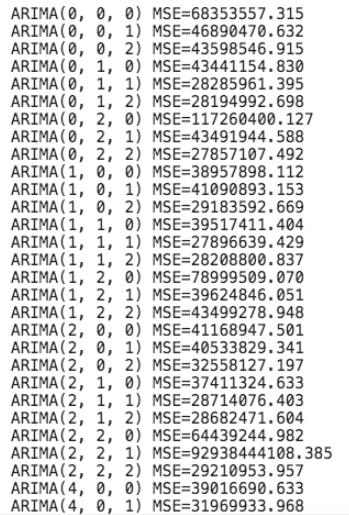

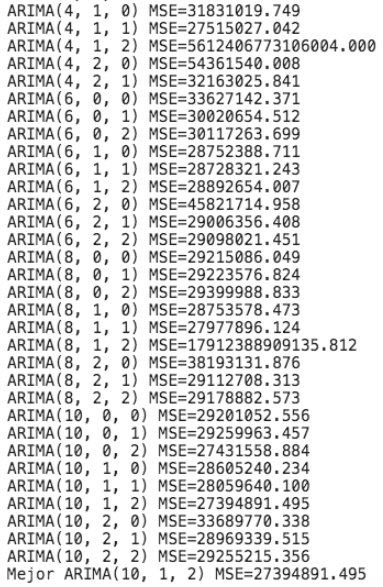

Esto me hace observar que los parametros en 8 se ven mejor que en relación al resto por lo que podriamos suponer que es por la unidad de medida semana por lo que procedere a intentarlo con 7. Este código tardo bastante en correr así que lo dejo escrito pero pego los resultados para hacerlo más práctico

In [ ]:
# Evaluar parámetros 7 
#p_values = [7]
#d_values = range(0, 3)
#q_values = range(0, 3)
#evaluate_models(series.values, p_values, d_values, q_values)


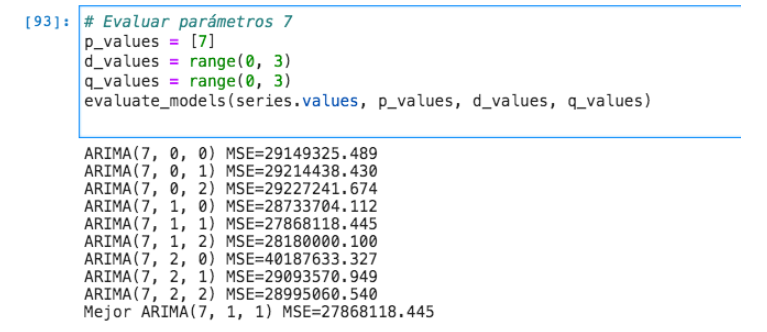

Haciendo la comparativa entre el mejor pronostico anterior que correspondía a:
- ARIMA (10,1,2)  MSE=27394891.495
Y el mejor pronostico con 7:
- ARIMA (7,1,1)  MSE=27868118.445
Se observa que el parametro con menor error es el de ARIMA (10,1,2) por lo que haré la ultima prueba con 14 que englobaría 2 semanas lo que corresponde a una unidad de medida de tiempo hábitual.

In [ ]:
# Evaluar parámetros 14
#p_values = [14]
#d_values = range(0, 3)
#q_values = range(0, 3)
#evaluate_models(series.values, p_values, d_values, q_values)


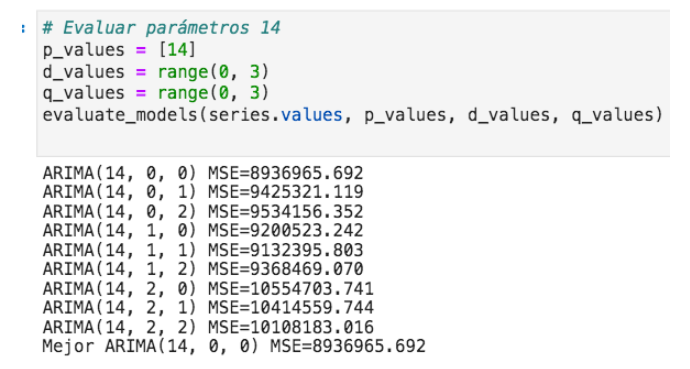

Los resultados de 14 fuerón mejor de lo que lo esperaba así que probaré con 30 ya que serían días de un mes calendario

In [ ]:
#Debo correrlo después porque se pega
# Evaluar parámetros 30
# p_values = [30]
# d_values = range(0, 3)
# q_values = range(0, 3)
# evaluate_models(series.values, p_values, d_values, q_values)

### Pasos a Seguir

El método de búsqueda de cuadrícula utilizado es simple y se puede ampliar fácilmente.
Algunas ideas para ampliar el enfoque:

- Cuadrícula de semillas . Las herramientas de diagnóstico clásicas de los gráficos ACF y PACF todavía se pueden utilizar con los resultados utilizados para sembrar la cuadrícula de parámetros ARIMA para la búsqueda.
- Medidas alternativas . La búsqueda busca optimizar el error cuadrático medio fuera de la muestra. Esto podría cambiarse a otra estadística fuera de la muestra, una estadística dentro de la muestra, como AIC o BIC, o alguna combinación de las dos. Puede elegir una métrica que sea más significativa para su proyecto.
- Diagnóstico residual . Las estadísticas se pueden calcular automáticamente sobre los errores de pronóstico residuales para proporcionar una indicación adicional de la calidad del ajuste. Los ejemplos incluyen pruebas estadísticas para determinar si la distribución de residuos es gaussiana y si existe una autocorrelación en los residuos.
- Actualizar modelo . El modelo ARIMA se crea desde cero para cada pronóstico de un paso. Con una inspección cuidadosa de la API, es posible actualizar los datos internos del modelo con nuevas observaciones en lugar de volver a crearlo desde cero.
- Condiciones previas . El modelo ARIMA puede hacer suposiciones sobre el conjunto de datos de series de tiempo, como normalidad y estacionariedad. Estos podrían verificarse y generar una advertencia para un conjunto de datos antes de que se entrene un modelo determinado.

#### Resumen
Se realizó un procedimiento para realizar una búsqueda en cuadrícula de hiperparámetros ARIMA para un pronóstico continuo de un paso

## 3.3.- SARIMA
Bibliografia:
- https://machinelearningmastery.com/sarima-for-time-series-forecasting-in-python/,

- https://machinelearningmastery.com/how-to-grid-search-sarima-model-hyperparameters-for-time-series-forecasting-in-python/,

El promedio móvil integrado autorregresivo, o ARIMA, es uno de los métodos de pronóstico más utilizados para el pronóstico de datos de series de tiempo univariantes.
Aunque el método puede manejar datos con una tendencia, no admite series de tiempo con un componente estacional.
Una extensión de ARIMA que apoya el modelado directo del componente estacional de la serie se llama SARIMA.
Realizaré el método de media móvil integrada autorregresiva estacional, o SARIMA.


USO: Para el pronóstico de series de tiempo con datos univariados que contienen tendencias y estacionalidad.

El promedio móvil integrado autorregresivo estacional, SARIMA o ARIMA estacional, es una extensión de ARIMA que admite explícitamente datos de series de tiempo univariantes con un componente estacional.
Agrega tres nuevos hiperparámetros para especificar la autorregresión (AR), la diferenciación (I) y la media móvil (MA) para el componente estacional de la serie, así como un parámetro adicional para el período de la estacionalidad.

Un modelo ARIMA estacional se forma al incluir términos estacionales adicionales en el ARIMA […] La parte estacional del modelo consiste en términos que son muy similares a los componentes no estacionales del modelo, pero involucran cambios hacia atrás del período estacional.

- CONFIGURACIÓN: Requiere la selección de hiperparámetros tanto para los elementos de tendencia como para los estacionales de la serie.
- ELEMENTOS DE TENDENCIA: Hay tres elementos de tendencia que requieren configuración. Son los mismos que el modelo ARIMA; específicamente:
    - p : orden de autorregresión de tendencia.
    - d : orden de diferencia de tendencia.
    - q : Orden de media móvil de tendencia.
- ELEMENTOS ESTACIONALES: Hay cuatro elementos estacionales que no forman parte de ARIMA que deben configurarse; son:
    - P : orden autorregresivo estacional.
    - D : orden de diferencia estacional.
    - P : Orden de media móvil estacional.
    - m : el número de pasos de tiempo para un solo período estacional.
- NOTACIÓN:    
SARIMA(p,d,q)(P,D,Q)m

### Primera Alternativa de Calculo

In [ ]:
from math import sqrt
from multiprocessing import cpu_count
from joblib import Parallel
from joblib import delayed
from warnings import catch_warnings
from warnings import filterwarnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error

# Pronóstico sarima de un paso
def sarima_forecast(history, config):
    order, sorder, trend = config
    # Defino el modelo
    model = SARIMAX(history, order=order, seasonal_order=sorder, trend=trend, enforce_stationarity=False, enforce_invertibility=False)
    # Entreno el modelo
    model_fit = model.fit(disp=False)
    # Hacer el pronostico de un paso
    yhat = model_fit.predict(len(history), len(history))
    return yhat[0]

In [ ]:
# Dividir un conjunto de datos univariante en conjuntos de Train / Test
def train_test_split(data, n_test):
    return data[:-n_test], data[-n_test:]

In [ ]:
# Error cuadrático medio de raíz o rmse
def measure_rmse(actual, predicted):
    return sqrt(mean_squared_error(actual, predicted))

In [ ]:
# Validación de avance para datos univariados
def walk_forward_validation(data, n_test, cfg):
    predictions = list()
    # Separando el dataset
    train, test = train_test_split(data, n_test)
    # Historial con conjunto de datos de entrenamiento
    history = [x for x in train]
    # Paso por encima de cada paso de tiempo en el conjunto de prueba
    for i in range(len(test)):
        # Ajustar el modelo y hacer un pronóstico para el historial
        yhat = sarima_forecast(history, cfg)
        # Almacenar el pronóstico en la lista de predicciones
        predictions.append(yhat)
        # Agregue la observación real al historial para el siguiente ciclo
        history.append(test[i])
    # Estimar el error de predicción
    error = measure_rmse(test, predictions)
    return error

In [ ]:
# Puntuar un modelo, devolver Ninguno en caso de fallo
def score_model(data, n_test, cfg, debug=False):
    result = None
    # Convertir config a una clave
    key = str(cfg)
    # Mostrar todas las advertencias y fallar en la excepción si se depura
    if debug:
        result = walk_forward_validation(data, n_test, cfg)
    else:
        # Una falla durante la validación del modelo sugiere una configuración inestable
        try:
            # Nunca muestre advertencias cuando busque en la red, demasiado ruidoso
            with catch_warnings():
                filterwarnings("ignore")
                result = walk_forward_validation(data, n_test, cfg)
        except:
            error = None
    # Comprobar si hay un resultado interesante
    if result is not None:
        print(' > Model[%s] %.3f' % (key, result))
    return (key, result)

In [ ]:
executor = Parallel(n_jobs=cpu_count(), backend='multiprocessing')

In [ ]:
cfg_list = []
tasks = (delayed(score_model)(data, n_test, cfg) for cfg in cfg_list)

In [ ]:
scores = executor(tasks)

In [ ]:
scores = [score_model(data, n_test, cfg) for cfg in cfg_list]

In [ ]:
# Configurción grid search 
def grid_search(data, cfg_list, n_test, parallel=True):
    scores = None
    if parallel:
        # Ejecutar configuraciones en paralelo
        executor = Parallel(n_jobs=cpu_count(), backend='multiprocessing')
        tasks = (delayed(score_model)(data, n_test, cfg) for cfg in cfg_list)
        scores = executor(tasks)
    else:
        scores = [score_model(data, n_test, cfg) for cfg in cfg_list]
    # Eliminar resultados vacíos
    scores = [r for r in scores if r[1] != None]
    # Ordenar configuraciones por error, asc
    scores.sort(key=lambda tup: tup[1])
    return scores

In [ ]:
# Crea un conjunto de configuraciones de sarima para probar
def sarima_configs(seasonal=[0]):
    models = list()
    # Define la configuración de la lista
    p_params = [0, 1, 2]
    d_params = [0, 1]
    q_params = [0, 1, 2]
    t_params = ['n','c','t','ct']
    P_params = [0, 1, 2]
    D_params = [0, 1]
    Q_params = [0, 1, 2]
    m_params = seasonal
    # create config instances
    for p in p_params:
        for d in d_params:
            for q in q_params:
                for t in t_params:
                    for P in P_params:
                        for D in D_params:
                            for Q in Q_params:
                                for m in m_params:
                                    cfg = [(p,d,q), (P,D,Q,m), t]
                                    models.append(cfg)
    return models

In [ ]:
# Configurando el modelo
cfg_list = sarima_configs(seasonal=[0,7,30])

In [ ]:
#Este código me tardó horas en correr así que lo comento y pego los resultados abajo para hacerlo más práctico
#if __name__ == '__main__':
    # load dataset
    #series = read_csv('monthly-car-sales.csv', header=0, index_col=0)
#   data = series.values
#   print(data.shape)
    # data split
#   n_test = 12
    # model configs
#   cfg_list = sarima_configs(seasonal=[0,6,12])
    # grid search
#   scores = grid_search(data, cfg_list, n_test)
#   print('done')
    # list top 3 configs
#   for cfg, error in scores[:3]:
#      print(cfg, error)

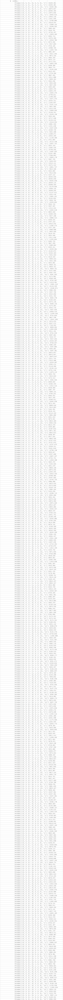

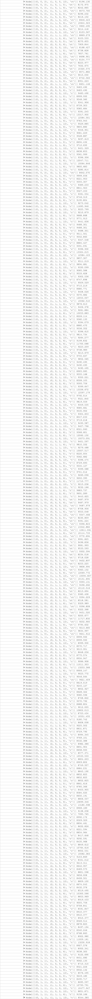


El mejor modelo fue:

  > Model[[(0, 0, 0), (2, 0, 2, 6), 'ct']] 7246.747

### Segunda Alternativa de Calculo

In [ ]:
# Traigo el dataset
diario = diario.drop(['fecha1'],axis=1)
#np.asarray (data)
data

X = diario.cantidad_pasos
y = diario['cantidad_pasos'].resample('MS').mean()

In [ ]:
import itertools

p = d = q = range(0, 4)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Ejemplos de combinaciones de parámetros para ARIMA estacional...')
print('SARIMA: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMA: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMA: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMA: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Ejemplos de combinaciones de parámetros para ARIMA estacional...
SARIMA: (0, 0, 1) x (0, 0, 1, 12)
SARIMA: (0, 0, 1) x (0, 0, 2, 12)
SARIMA: (0, 0, 2) x (0, 0, 3, 12)
SARIMA: (0, 0, 2) x (0, 1, 0, 12)


In [ ]:
#for param in pdq:
#    for param_seasonal_pdq in seasonal_pdq:
#        try:
#            mod = sm.tsa.statespace.SARIMAX(y, 
#                                            order=param, 
#                                            seasonal_order=param_seasonal_pdq, 
#                                            enforce_stationarity=False, 
#                                            enforce_invertibility=False)
#            results = mod.fit()
#            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal_pdq, results.aic))
#        except:
#            continue

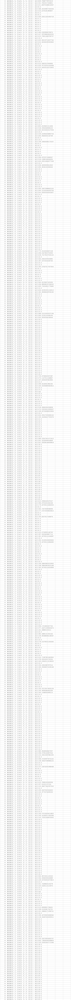

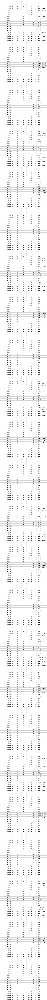

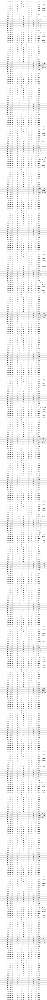

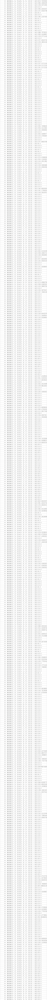

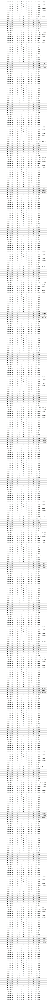

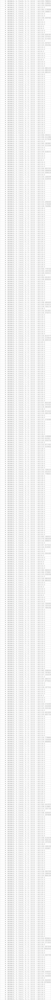

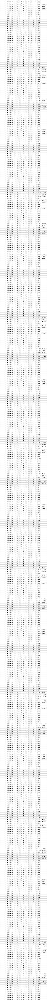

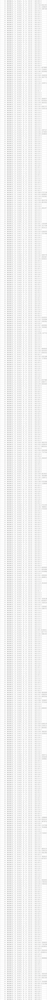

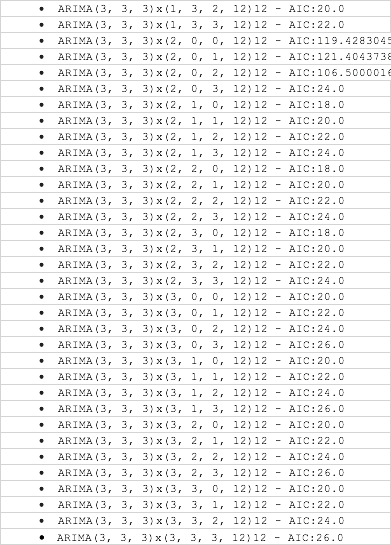

Luego de estimar varios modelos medienante un ciclo "for", utilizaremos el Criterio de información de Akaike, que consiste en elegir el que tenga menor AIC, este es un criterio de selección para quedarnos con el modelo más parsimonioso, de los cuales destacan:

- ARIMA(0, 1, 0)x(0, 3, 0, 12)12 - AIC:2.0
- ARIMA(0, 0, 0)x(0, 3, 0, 12)12 - AIC:2.0
- ARIMA(0, 1, 0)x(0, 3, 0, 12)12 - AIC:2.0
- ARIMA(0, 3, 0)x(0, 3, 0, 12)12 - AIC:2.0

Observamos que los mejores modelos:
- No tiene un componente atras AR.
- Es diferenciado, lo que va en linea a la prueba de Dicky Fuller.
- No tiene componente MA.

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6977      0.238      2.927      0.003       0.230       1.165
ma.L1         -0.6103      0.284     -2.148      0.032      -1.167      -0.053
ar.S.L12      -0.1460      0.078     -1.880      0.060      -0.298       0.006
sigma2       1.85e+07   1.06e-08   1.74e+15      0.000    1.85e+07    1.85e+07


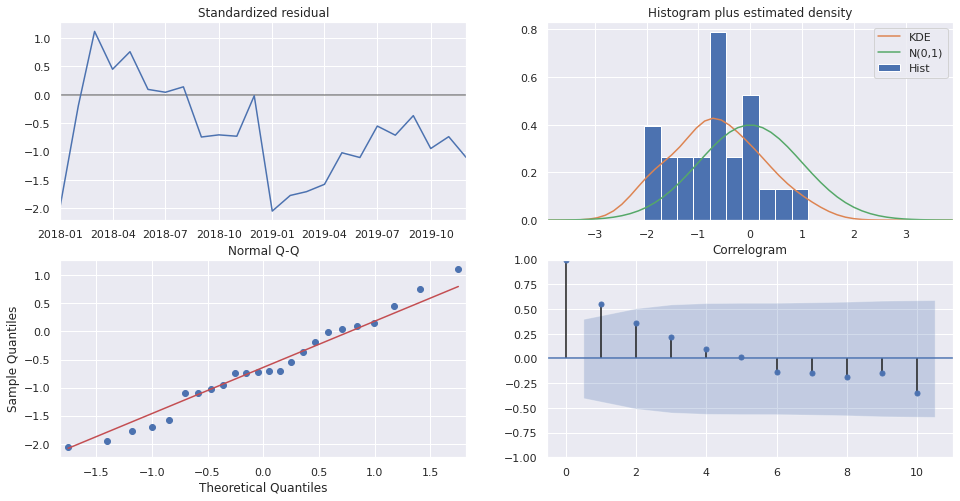

In [ ]:
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 0, 1),
                                seasonal_order=(1, 1, 0, 12),
                                #enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

results.plot_diagnostics(figsize=(16, 8))
plt.show()

Los graficos son las propiedades estadisticas de la serie y el modelo:
 - El primer gráfico corresponde al ruido del modelo
 - El segundo gráfico a la distriución del modelo 
 - El tercer gráfico es para corroborar si los ruidos del modelo se distribuyen normalmente.
 - El cuartoes autocorrelograma, con este sabemos el orden del modelo.

## 3.4.- PRONOSTICO A LARGO PLAZO

### Validación del Modelo

Primero vamos a validar el modelo y ver que tan bien predice. Vamos a limitar los datos a un punto ( en este caso, principios de 2017) y vamos a pronósticar todo el 2019 y ver que tanto difiere el pronóstico del valor real.

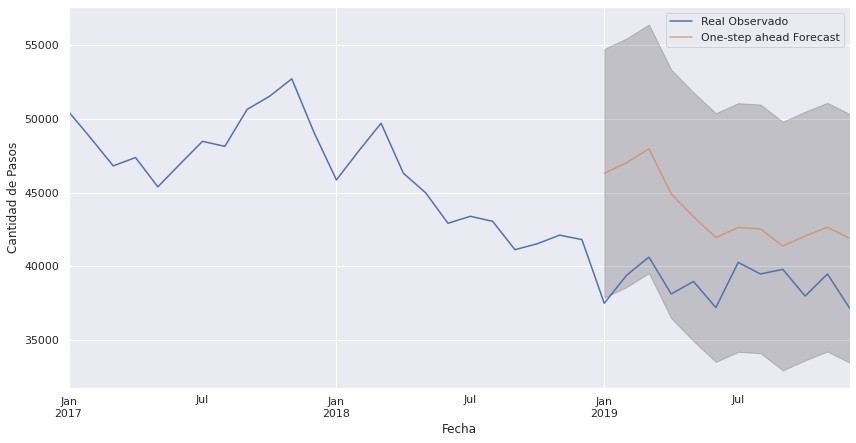

In [ ]:
pred = results.get_prediction(start=pd.to_datetime('2019-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['2017':].plot(label='Real Observado')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Fecha')
ax.set_ylabel('Cantidad de Pasos')
plt.legend()
plt.show()

In [ ]:
y_forecasted = pred.predicted_mean
y_truth = y['2017-01-01':]
mse = ((y_forecasted - y_truth) ** 2).mean()
print('El error cuadrático medio de nuestros pronósticos es {}'.format(round(mse, 2)))
print('El error cuadrático medio de nuestros pronósticos es {}'.format(round(np.sqrt(mse), 2)))

El error cuadrático medio de nuestros pronósticos es 28678747.62
El error cuadrático medio de nuestros pronósticos es 5355.25


El pronóstico se adapta  bien al componente estacional, sube cuando tiene que subir, baja cuando tiene que bajar por lo que ahora se realizará un pronostico a largo plazo para años superiores al 2020

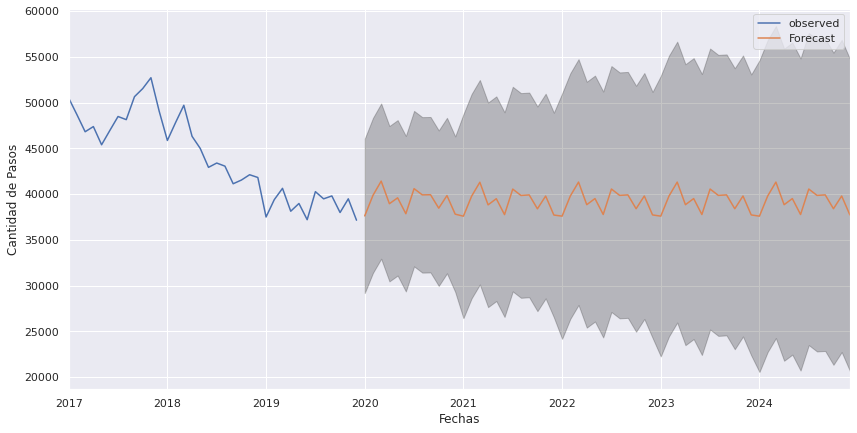

In [ ]:
pred_uc = results.get_forecast(steps=60)
pred_ci = pred_uc.conf_int()
ax = y.plot(label='observed', figsize=(14, 7))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Fechas')
ax.set_ylabel('Cantidad de Pasos')
plt.legend()
plt.show()

El modelo debiese tender a la baja ya que el uso de efectivo cada vez disminuye más.

 ### One-Step Prediction

Vamos a entrenar un `RandomForestRegressor` para predecir el siguiente valor en la serie de tiempo semanal de temperatura. Utilizaremos los diez primeros años como conjunto de entrenamiento. Y los años 11 a 14 como evaluación. Para ello, tenemos que llevar los datos a la forma vista durante la presentación.

In [ ]:
senial = semanal.cantidad_pasos
senial.head()

fecha1
2017-01-01    31183.000000
2017-01-08    49601.714286
2017-01-15    52344.714286
2017-01-22    51030.714286
2017-01-29    50654.428571
Freq: W-SUN, Name: cantidad_pasos, dtype: float64

In [ ]:
senial.shape

(158,)

In [ ]:
#En primer lugar, debemos definir cuántos valores *hacia atrás* tomaremos.
look_back = 13
#Antes decia 13

#13 semanas de datos para predecir el valor siguiente lo que corresponde a tres meses apróx

In [ ]:
#Creamos los `X` e `y` con ceros para luego llenar con los datos. Notar los `shape`
N = senial.shape[0]
X = np.zeros((N - look_back - 1,look_back))
y = np.zeros(N - look_back - 1)
print(X.shape, y.shape)

(144, 13) (144,)


In [ ]:
#Llenamos los `X` e `y`
for i in range(X.shape[0]):
#     X[i,:] = senial.values.iloc[i:i+look_back]
#     y[i] = senial.values.iloc[i+look_back]
    X[i,:] = senial.iloc[i:i+look_back]
    y[i] = senial.iloc[i+look_back]

In [ ]:
#Mirando la matriz que arroja
print(X)

[[31183.         49601.71428571 52344.71428571 ... 45927.71428571
  47256.28571429 45583.28571429]
 [49601.71428571 52344.71428571 51030.71428571 ... 47256.28571429
  45583.28571429 47613.85714286]
 [52344.71428571 51030.71428571 50654.42857143 ... 45583.28571429
  47613.85714286 47803.66666667]
 ...
 [38941.71428571 39989.57142857 41081.14285714 ... 37785.71428571
  38079.28571429 40413.        ]
 [39989.57142857 41081.14285714 38926.14285714 ... 38079.28571429
  40413.         38994.28571429]
 [41081.14285714 38926.14285714 37262.85714286 ... 40413.
  38994.28571429 41840.14285714]]


En la Matriz se observa que se cumple el principio de One-Step Prediction


In [ ]:
#Hacemos el train/test split
N_train = 110 - look_back # 157 * 0,7 cantidad de instancias que vamos a usar para entrenar. 
N_test = 47 #158*0,3 cantidad de puntos que vamos a usar para evaluar
N_total = N_train + N_test

length_total = N_train + N_test + look_back

X_train = X[:N_train,:]
y_train = y[:N_train]
print(X_train.shape, y_train.shape)

X_test = X[N_train:N_train+N_test,:]
y_test = y[N_train:N_train+N_test]
print(X_test.shape, y_test.shape)

(97, 13) (97,)
(47, 13) (47,)


In [ ]:
#Entrenamos
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs = 4).fit(X_train,y_train)

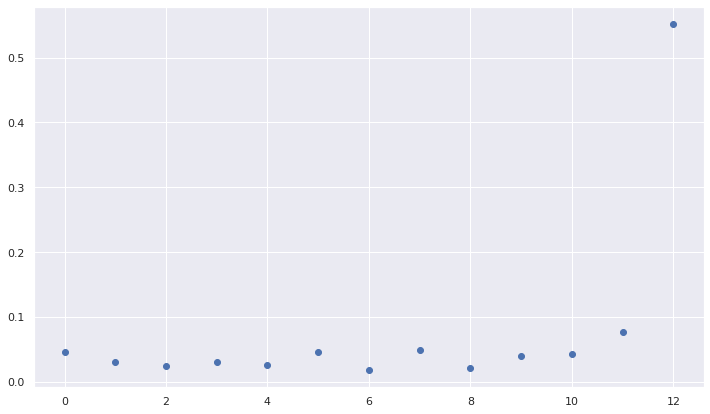

In [ ]:
# Graficamos la importancia de cada feature.
plt.figure(figsize = (12,7))
plt.scatter(np.arange(rf.feature_importances_.size),rf.feature_importances_)
# for x in np.arange(3)*52:
#     plt.axvline(x, linestyle ='--', color= 'r')
plt.show()

In [ ]:
#Predecimos
y_pred = rf.predict(X)
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

Graficando, la predicción

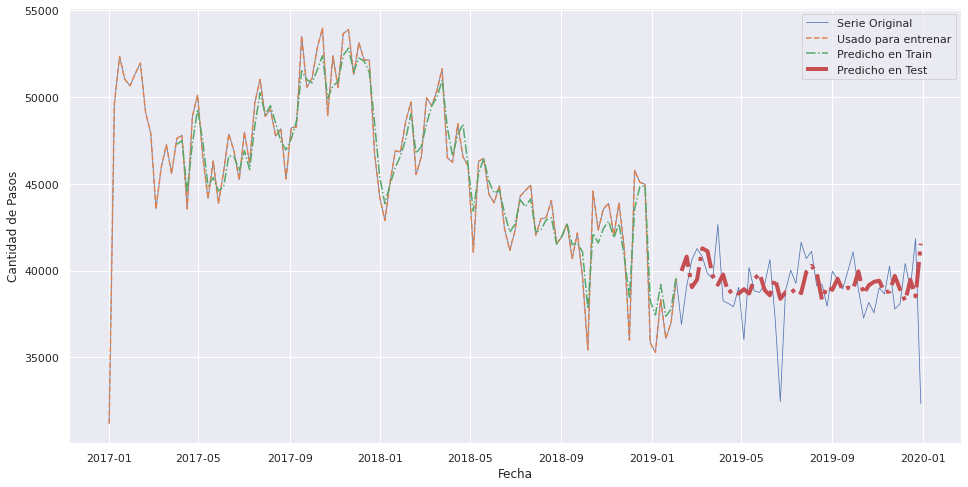

In [ ]:

plt.figure(figsize=(16,8))
plt.plot(senial.index[:length_total], senial[:length_total],lw = 0.75, label = 'Serie Original')
plt.plot(senial.index[:N_train + look_back], senial[:N_train + look_back],'--', label = 'Usado para entrenar')
plt.plot(senial.index[look_back: look_back + N_train], y_train_pred,'-.',label = 'Predicho en Train')
plt.plot(senial.index[N_train+look_back: length_total], y_test_pred,'-.', lw = 4, label = 'Predicho en Test')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Pasos')
plt.legend()

plt.show()


In [ ]:
#Calculamos el error RMSE en train y test.

MSE = mean_squared_error(y_train, y_train_pred)
print('Error en Train:',np.sqrt(MSE))

MSE = mean_squared_error(y_test, y_test_pred)
print('Error en Test:',np.sqrt(MSE))

Error en Train: 1065.6159571167184
Error en Test: 2206.038616235268


### Benchmark
Comparamos el error con el que habríamos obtenido si predecíamos copiando el valor de la fecha anterior.

In [ ]:
y_test_pred_benchmark = y[-1 + N_train:N_train+N_test - 1]

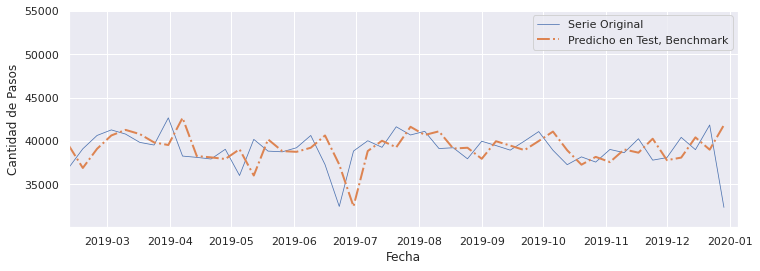

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(senial.index[:length_total], senial[:length_total],lw = 0.75, label = 'Serie Original')
plt.plot(senial.index[N_train+look_back: length_total], y_test_pred_benchmark,'-.', lw = 2, label = 'Predicho en Test, Benchmark')
plt.xlim(senial.index[N_train+look_back], senial.index[length_total])
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Pasos')
plt.legend()

plt.show()


In [ ]:
y_test_pred_benchmark = y[-1 + N_train:N_train+N_test - 1]
MSE = mean_squared_error(y_test, y[-1 + N_train:N_train+N_test - 1])
print(np.sqrt(MSE))

2521.911463389328


Multi-Step Prediction

In [ ]:
y_ms_test_pred = []
x = X_test[0,:] # arrancamos con la primera instancias del conjunto de test
for i in range(y_test.size):
    y_os_pred = rf.predict(x.reshape(1,-1))
    y_ms_test_pred.append(y_os_pred)
    x = np.append(x[1:], y_os_pred)
y_ms_test_pred = np.array(y_ms_test_pred)

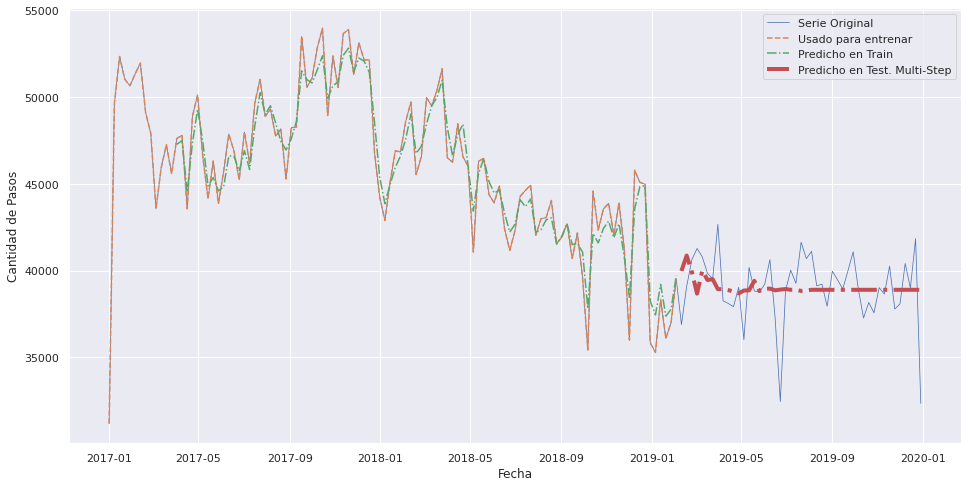

In [ ]:
plt.figure(figsize=(16,8))
plt.plot(senial.index[:length_total], senial[:length_total],lw = 0.75, label = 'Serie Original')
plt.plot(senial.index[:N_train + look_back], senial[:N_train + look_back],'--', label = 'Usado para entrenar')
plt.plot(senial.index[look_back: look_back + N_train], y_train_pred,'-.',label = 'Predicho en Train')
plt.plot(senial.index[N_train+look_back: length_total], y_ms_test_pred,'-.', lw = 4, label = 'Predicho en Test. Multi-Step')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Pasos')
plt.legend()

plt.show()



In [ ]:
#Calculamos el error RMSE
MSE = mean_squared_error(y_test, y_ms_test_pred)
print('Error en Train:',np.sqrt(MSE))

Error en Train: 1971.7780082510983


### Conclusión

Revisando el comportamiento de las variables e iterando los resultados pude observar que a mayor tiempo de look_back las predicciones a largo plazo tenían menor certeza.
En esta comparativa el mejor modelo se da cuando se utiliza One-Step Prediction donde:

- N: largo de la serie.
- n: look back, equivalente
a cantidad de features

## 4.- Investigar e Implementar

### 4.1 .- Incorporación de info adicional

¿Cómo incorporarías la información sobre tipo de vehículo, forma de pago, sentido, día de la semana, etc.? En lo que respecta a las predicciones, ¿mejoran o empeoran?

In [ ]:
#Unimos los 3 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
dataset = pd.concat([data_2019, data_2018, data_2017])
print("Unimos los 3 datasets",dataset.shape)

#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset.drop(columns=['periodo','fecha','hora_fin','hora_inicio'], inplace = True)

#Corregimos el nombre de fecha2 a fecha
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True) 

#Reordenamos el dataset por fecha
dataset.sort_values('fecha', inplace = True)
dataset.reset_index(drop=True, inplace = True)

#Guardaré en data, el dataset con todas sus celdas
data = pd.DataFrame(dataset)
#Quitamos las columnas que no vamos a utilizar
dataset.drop(columns = ['dia','tipo_vehiculo',"forma_pago"], inplace = True)



Unimos los 3 datasets (3560706, 10)


In [ ]:
print("Los Nombres de las estaciones son: ", dataset['estacion'].unique())


Los Nombres de las estaciones son:  ['Dellepiane Centro' 'Illia' 'Dellepiane Liniers' 'Avellaneda' 'Retiro'
 'Salguero' 'Alberdi' 'Sarmiento' 'Dellepiane' 'Alberti' 'PDB']


Las estaciones son:
  - Dellepiane Centro
  - Illia
  - Dellepiane Liniers
  - Avellaneda
  - Retiro
  - Salguero
  - Alberdi'
  - Sarmiento' '
  - Dellepiane' '
  - Alberti'
  - PDB

In [ ]:
#dataset.set_index('fecha', inplace=True)

#Creando el dataset filtrado por estación:
Dellepiane_Centro = (dataset["estacion"] == "Dellepiane Centro")
Dellepiane_Centro = dataset[Dellepiane_Centro]

Illia = (dataset["estacion"] == "Illia")
Illia = dataset[Illia]

Dellepiane_Liniers = (dataset["estacion"] == "Dellepiane_Liniers")
Dellepiane_Liniers = dataset[Dellepiane_Liniers]

Avellaneda = (dataset["estacion"] == "Avellaneda")
Avellaneda = dataset[Avellaneda]

Retiro = (dataset["estacion"] == "Retiro")
Retiro = dataset[Retiro]

Salguero = (dataset["estacion"] == "Salguero")
Salguero = dataset[Salguero]

Alberdi = (dataset["estacion"] == "Alberdi")
Alberdi = dataset[Alberdi]

Sarmiento = (dataset["estacion"] == "Sarmiento")
Sarmiento = dataset[Sarmiento]

Dellepiane = (dataset["estacion"] == "Dellepiane")
Dellepiane = dataset[Dellepiane]

Alberti = (dataset["estacion"] == "Alberti")
Alberti = dataset[Alberti]

PDB = (dataset["estacion"] == "PDB")
PDB = dataset[PDB]

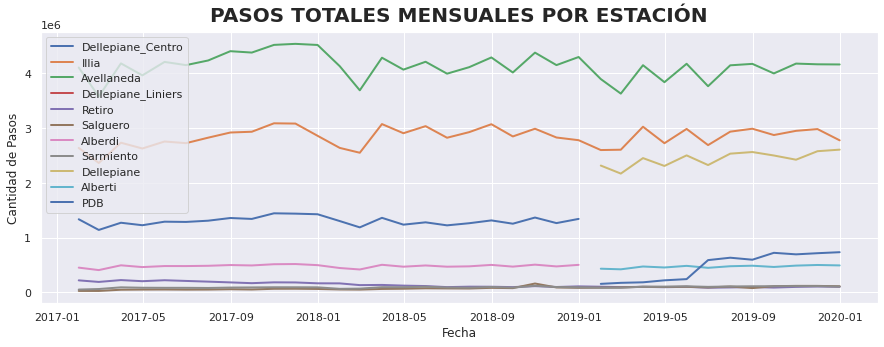

In [ ]:
#Resample por mes para mejorar la visualización de tendencia
M_Dellepiane_Centro = Dellepiane_Centro.resample('M').sum()
M_Illia = Illia.resample('M').sum()
M_Avellaneda = Avellaneda.resample('M').sum()
M_Dellepiane_Liniers = Dellepiane_Liniers.resample('M').sum()
M_Retiro = Retiro.resample('M').sum()
M_Salguero = Salguero.resample('M').sum()
M_Alberdi = Alberdi.resample('M').sum()
M_Sarmiento = Sarmiento.resample('M').sum()
M_Dellepiane = Dellepiane.resample('M').sum()
M_Alberti = Alberti.resample('M').sum()
M_PDB = PDB.resample('M').sum()


#Graficando
plt.figure(figsize = (15,5))
plt.plot(M_Dellepiane_Centro.cantidad_pasos, label = 'Dellepiane_Centro', lw=2,linestyle="-")
plt.plot(M_Illia.cantidad_pasos, label = 'Illia', lw=2,linestyle="-")
plt.plot(M_Avellaneda.cantidad_pasos, label = 'Avellaneda', lw=2,linestyle="-")
plt.plot(M_Dellepiane_Liniers.cantidad_pasos, label = 'Dellepiane_Liniers', lw=2,linestyle="-")
plt.plot(M_Retiro.cantidad_pasos, label = 'Retiro', lw=2,linestyle="-")
plt.plot(M_Salguero.cantidad_pasos, label = 'Salguero', lw=2,linestyle="-")
plt.plot(M_Alberdi.cantidad_pasos, label = 'Alberdi', lw=2,linestyle="-")
plt.plot(M_Sarmiento.cantidad_pasos, label = 'Sarmiento', lw=2,linestyle="-")
plt.plot(M_Dellepiane.cantidad_pasos, label = 'Dellepiane', lw=2,linestyle="-")
plt.plot(M_Alberti.cantidad_pasos, label = 'Alberti', lw=2,linestyle="-")
plt.plot(M_PDB.cantidad_pasos, label = 'PDB', lw=2,linestyle="-")

plt.legend()
plt.title("PASOS TOTALES MENSUALES POR ESTACIÓN",pad=10, fontweight="bold", fontsize=20)

plt.xlabel('Fecha')
plt.ylabel('Cantidad de Pasos')
#plt.ylim(-10,40)
plt.show()

In [ ]:
#Revisando los sentidos de las calles:
print("Los Sentidos de la estación Dellepiane_Centro son: ", Dellepiane_Centro['sentido'].unique())
print("Los Sentidos de la estación Illia son: ", Illia['sentido'].unique())
print("Los Sentidos de la estación Dellepiane_Liniers son: ", Dellepiane_Liniers['sentido'].unique())
print("Los Sentidos de la estación Avellaneda son: ", Avellaneda['sentido'].unique())
print("Los Sentidos de la estación Retiro son: ", Retiro['sentido'].unique())
print("Los Sentidos de la estación Salguero son: ", Salguero['sentido'].unique())
print("Los Sentidos de la estación Alberdi son: ", Alberdi['sentido'].unique())
print("Los Sentidos de la estación Sarmiento son: ", Sarmiento['sentido'].unique())
print("Los Sentidos de la estación Dellepiane son: ", Dellepiane['sentido'].unique())
print("Los Sentidos de la estación Alberti son: ", Alberti['sentido'].unique())
print("Los Sentidos de la estación PDB son: ", PDB['sentido'].unique())


Los Sentidos de la estación Dellepiane_Centro son:  ['Centro']
Los Sentidos de la estación Illia son:  ['Provincia' 'Centro']
Los Sentidos de la estación Dellepiane_Liniers son:  []
Los Sentidos de la estación Avellaneda son:  ['Centro' 'Provincia']
Los Sentidos de la estación Retiro son:  ['Provincia']
Los Sentidos de la estación Salguero son:  ['Provincia']
Los Sentidos de la estación Alberdi son:  ['Centro' 'Provincia']
Los Sentidos de la estación Sarmiento son:  ['Provincia']
Los Sentidos de la estación Dellepiane son:  ['Provincia' 'Centro']
Los Sentidos de la estación Alberti son:  ['Centro' 'Provincia']
Los Sentidos de la estación PDB son:  ['Provincia' 'Centro']


### Revisando por Estación - Sentido Centro

In [ ]:
#Filtrando por Sentido Provincia
Illia_P = (Illia["sentido"] == "Provincia")
Illia_P = Illia[Illia_P]
Illia_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Illia_P.set_index('fecha', inplace=True)
Illia_P = Illia_P.resample('D').sum()


Avellaneda_P = (Avellaneda["sentido"] == "Provincia")
Avellaneda_P = Avellaneda[Avellaneda_P]
Avellaneda_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Avellaneda_P.set_index('fecha', inplace=True)
Avellaneda_P = Avellaneda_P.resample('D').sum()


Retiro_P = (Retiro["sentido"] == "Provincia")
Retiro_P = Retiro[Retiro_P]
Retiro_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Retiro_P.set_index('fecha', inplace=True)
Retiro_P = Retiro_P.resample('D').sum()


Salguero_P = (Salguero["sentido"] == "Provincia")
Salguero_P = Salguero[Salguero_P]
Salguero_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Salguero_P.set_index('fecha', inplace=True)
Salguero_P = Salguero_P.resample('D').sum()


Alberdi_P = (Alberdi["sentido"] == "Provincia")
Alberdi_P = Alberdi[Alberdi_P]
Alberdi_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Alberdi_P.set_index('fecha', inplace=True)
Alberdi_P = Alberdi_P.resample('D').sum()


Sarmiento_P = (Sarmiento["sentido"] == "Provincia")
Sarmiento_P = Sarmiento[Sarmiento_P]
Sarmiento_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Sarmiento_P.set_index('fecha', inplace=True)
Sarmiento_P = Sarmiento_P.resample('D').sum()


Dellepiane_P = (Dellepiane["sentido"] == "Provincia")
Dellepiane_P = Dellepiane[Dellepiane_P]
Dellepiane_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Dellepiane_P.set_index('fecha', inplace=True)
Dellepiane_P = Dellepiane_P.resample('D').sum()


Alberti_P = (Alberti["sentido"] == "Provincia")
Alberti_P = Alberti[Alberti_P]
Alberti_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Alberti_P.set_index('fecha', inplace=True)
Alberti_P = Alberti_P.resample('D').sum()


PDB_P = (PDB["sentido"] == "Provincia")
PDB_P = PDB[PDB_P]
PDB_P.drop(columns = ["estacion",'sentido'], inplace = True)
#PDB_P.set_index('fecha', inplace=True)
PDB_P = PDB_P.resample('D').sum()



In [ ]:
#Filtrando por Sentido Centro
Dellepiane_Centro_C = (Dellepiane_Centro["sentido"] == "Centro")
Dellepiane_Centro_C = Dellepiane_Centro[Dellepiane_Centro_C]
Dellepiane_Centro_C.drop(columns = ["estacion",'sentido'], inplace = True)
#Dellepiane_Centro_C.set_index('fecha', inplace=True)
Dellepiane_Centro_C = Dellepiane_Centro_C.resample('D').sum()


Illia_C = (Illia["sentido"] == "Centro")
Illia_C = Illia[Illia_C]
Illia_C.drop(columns = ["estacion",'sentido'], inplace = True)
#Illia_C.set_index('fecha', inplace=True)
Illia_C = Illia_C.resample('D').sum()


Avellaneda_C = (Avellaneda["sentido"] == "Centro")
Avellaneda_C = Avellaneda[Avellaneda_C]
Avellaneda_C.drop(columns = ["estacion",'sentido'], inplace = True)
#Avellaneda_C.set_index('fecha', inplace=True)
Avellaneda_C = Avellaneda_C.resample('D').sum()

Alberdi_C = (Alberdi["sentido"] == "Centro")
Alberdi_C = Alberdi[Alberdi_C]
Alberdi_C.drop(columns = ["estacion",'sentido'], inplace = True)
#Alberdi_C.set_index('fecha', inplace=True)
Alberdi_C = Alberdi_C.resample('D').sum()

Dellepiane_C = (Dellepiane["sentido"] == "Centro")
Dellepiane_C = Dellepiane[Dellepiane_C]
Dellepiane_C.drop(columns = ["estacion",'sentido'], inplace = True)
#Dellepiane_C.set_index('fecha', inplace=True)
Dellepiane_C = Dellepiane_C.resample('D').sum()

Alberti_C = (Alberti["sentido"] == "Centro")
Alberti_C = Alberti[Alberti_C]
Alberti_C.drop(columns = ["estacion",'sentido'], inplace = True)
#Alberti_C.set_index('fecha', inplace=True)
Alberti_C = Alberti_C.resample('D').sum()

PDB_C = (PDB["sentido"] == "Centro")
PDB_C = PDB[PDB_C]
PDB_C.drop(columns = ["estacion",'sentido'], inplace = True)
#PDB_C.set_index('fecha', inplace=True)
PDB_C = PDB_C.resample('D').sum()

#print("Estadisticas PDB Centro:", Dellepiane_Centro_C.describe())
#print("Estadisticas Illia_C:", Illia_C.describe())
#print("Estadisticas Avellaneda_C Centro:", Avellaneda_C.describe())
#print("Estadisticas Alberdi_C Centro:", Alberdi_C.describe())
#print("Estadisticas Dellepiane_C Centro:", Dellepiane_C.describe())
#print("Estadisticas Alberti_C Centro:", Alberti_C.describe())
#print("Estadisticas PDB_C Centro:", PDB_C.describe())

In [ ]:
centro = (dataset["sentido"] == "Centro")
centro = dataset[centro]

provincia = (dataset["sentido"] == "provincia")
provincia = dataset[provincia]

#### Dellepiane_Centro_C 2017 - 2018

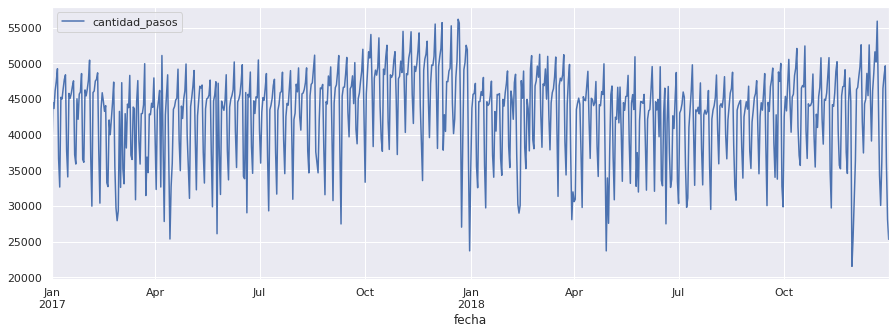

In [ ]:
Dellepiane_Centro_C.plot(grid=True, figsize=(15,5))

No hay información del 2019 por lo que no lo filtraré esta estación, se llama Dellepiane_C

#### Illia_C - 2017 - 2018 - 2019

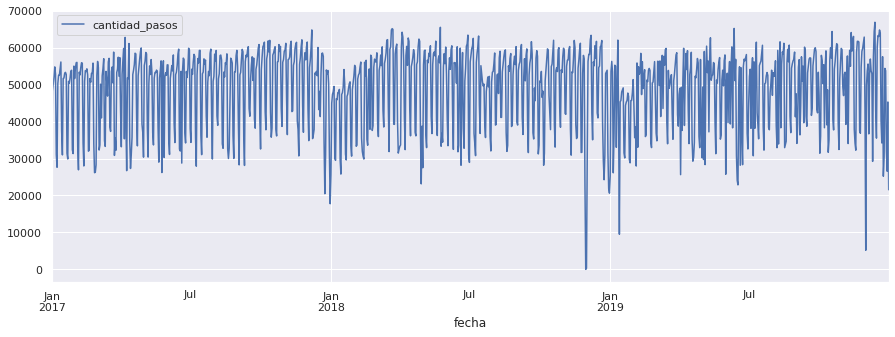

In [ ]:
Illia_C.plot(grid=True, figsize=(15,5))


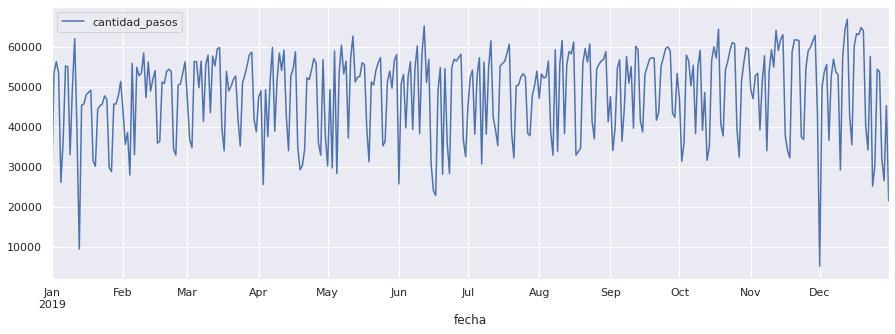

In [ ]:
#Como están en distinto periodo y hay una baja en el 2019 estudiaré ese año
from datetime import datetime
start_date = datetime(2019, 1, 1)
end_date = datetime(2019, 12, 31)
date_filter = (Illia_C.index >= start_date) & (Illia_C.index 	<= end_date)
Illia_19 = Illia_C[date_filter]
Illia_19.plot(grid=True, figsize=(15,5))

#### Avellanada 2017 - 2018 - 2019

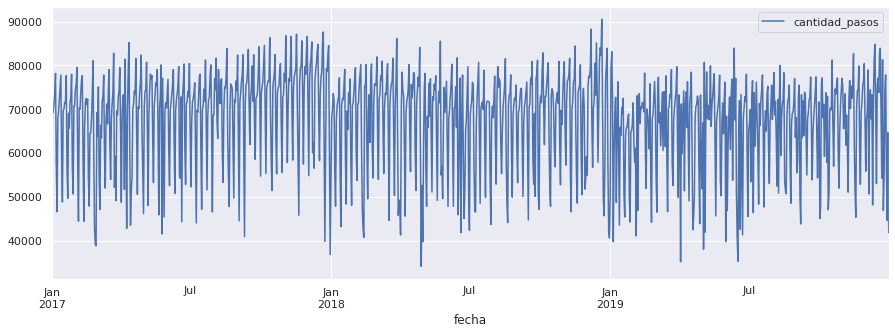

In [ ]:
Avellaneda_C.plot(grid=True, figsize=(15,5))


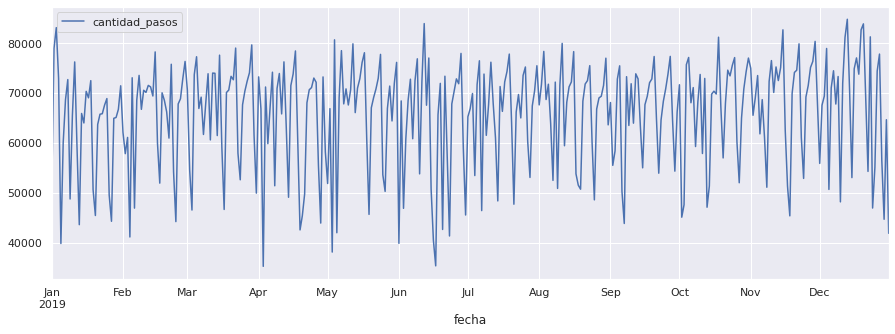

In [ ]:
#Como están en distinto periodo y hay una baja en el 2019 estudiaré ese año
date_filter = (Avellaneda_C.index >= start_date) & (Avellaneda_C.index 	<= end_date)
Avellaneda_19 = pd.DataFrame(Avellaneda_C[date_filter])
Avellaneda_19.plot(grid=True, figsize=(15,5))


#### Alberdi 2017 - 2018

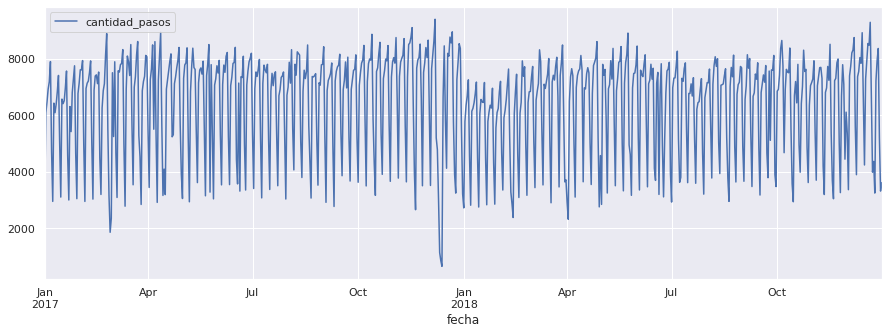

In [ ]:
Alberdi_C.plot(grid=True, figsize=(15,5))


No hay 2019 por lo que no lo trabajaré en mayor profundidad

#### Dellepiane_C 2019

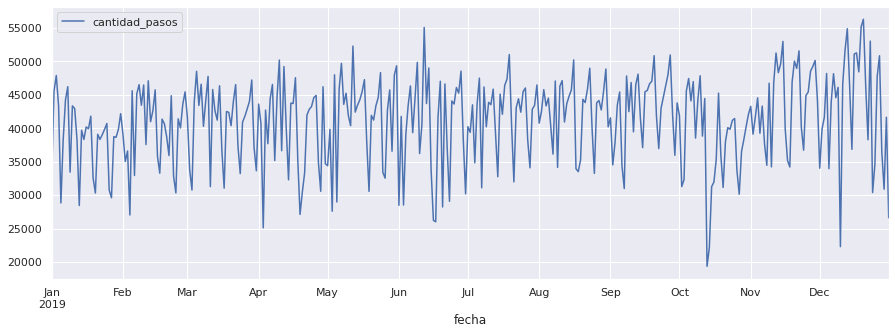

In [ ]:
Dellepiane_C.plot(grid=True, figsize=(15,5))
Dellepiane_C_19 = pd.DataFrame(Dellepiane_C)

#### Alberti_C - 2019

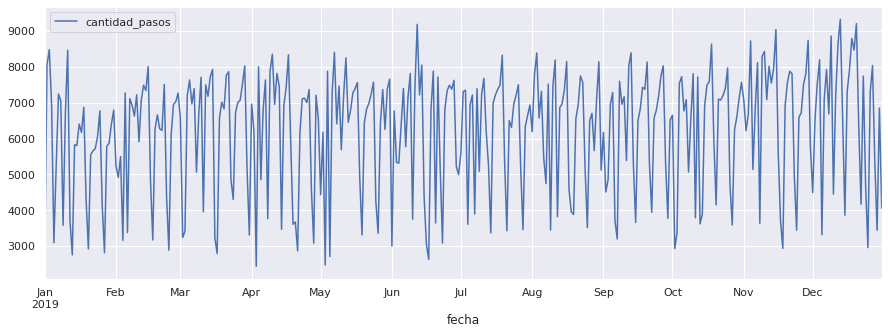

In [ ]:
Alberti_C.plot(grid=True, figsize=(15,5))
Alberti_C_19 = pd.DataFrame(Alberti_C)

#### PDB_C - 2019

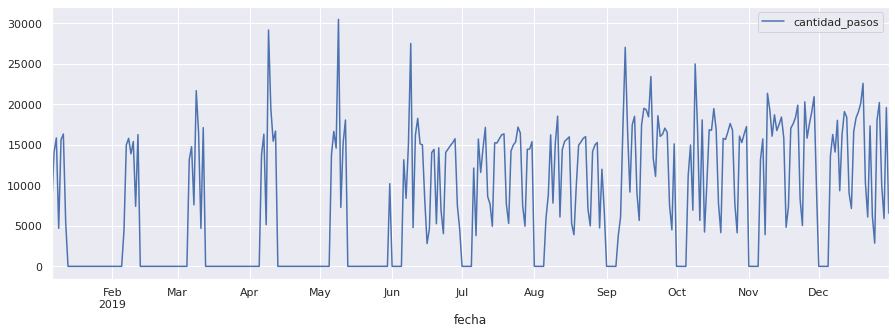

In [ ]:
PDB_C.plot(grid=True, figsize=(15,5))
PDB_19 = pd.DataFrame(PDB_C)

#### Conclusión

In [ ]:
"""
Analizando las estadisticas de lo ocurrido en el 2019 - Dirección Centro
"""

e_2019 = [
           ('Illia_C', Illia_19.cantidad_pasos.sum(), Illia_19.cantidad_pasos.mean(),
            Illia_19.cantidad_pasos.min(),Illia_19.cantidad_pasos.max()),
           ('Avellaneda_C', Avellaneda_19.cantidad_pasos.sum(), Avellaneda_19.cantidad_pasos.mean(),
            Avellaneda_19.cantidad_pasos.min(), Avellaneda_19.cantidad_pasos.max()),
           ("Dellepiane_C", Dellepiane_C_19.cantidad_pasos.sum(), Dellepiane_C_19.cantidad_pasos.mean(),
            Dellepiane_C_19.cantidad_pasos.min(), Dellepiane_C_19.cantidad_pasos.max()),
           ('Alberti_C', Alberti_C_19.cantidad_pasos.sum(), Alberti_C_19.cantidad_pasos.mean(),
            Alberti_C_19.cantidad_pasos.min(), Alberti_C_19.cantidad_pasos.max()),
           ('PDB_C', PDB_19.cantidad_pasos.sum(), PDB_19.cantidad_pasos.mean(),
            PDB_19.cantidad_pasos.min(), PDB_19.cantidad_pasos.max())]

e_centro = pd.DataFrame(data = e_2019, columns=['Estación','Pasos Totales','Promedio Pasos', "Pasos Minimos","Pasos Máximos"])
e_centro

,Estación,Pasos Totales,Promedio Pasos,Pasos Minimos,Pasos Máximos
0,Illia_C,17618673,48270.336986,5160,66877
1,Avellaneda_C,24000094,65753.682192,35228,84836
2,Dellepiane_C,15007103,41115.350685,19356,56282
3,Alberti_C,2271801,6224.112329,2434,9333
4,PDB_C,2883522,8009.783333,0,30493


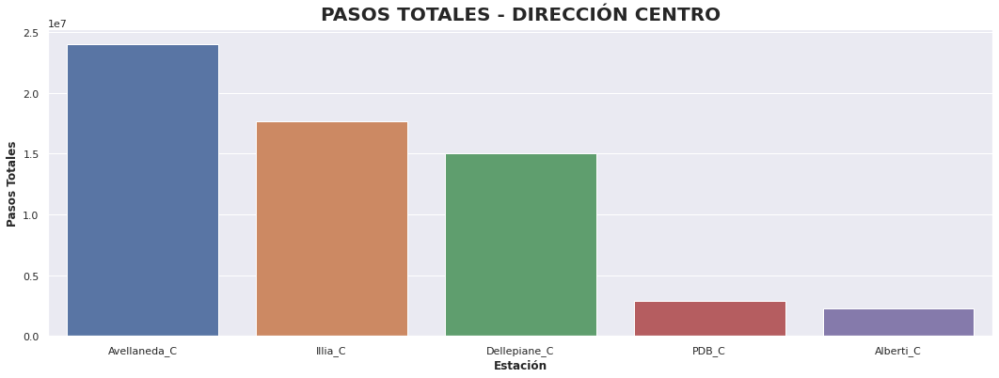

In [ ]:
e_centro.sort_values(by=['Pasos Totales'], ascending=False, inplace=True)

f, axe = plt.subplots(1,1, figsize=(18,6))
sns.barplot(x='Estación', y='Pasos Totales', data=e_centro, ax = axe)
axe.set_title("PASOS TOTALES - DIRECCIÓN CENTRO",pad=10, fontweight="bold", fontsize=20)
axe.set_xlabel('Estación', size=12, fontweight="bold")
axe.set_ylabel('Pasos Totales', size=12, fontweight="bold")

plt.show()


### 4.2.- Comparando las estaciones de Peaje

¿Qué ocurre si comparas las series de tiempo entre distintas estaciones de peajes?¿Tienen el mismo comportamiento o hay alguna que sea distinta a las otras? Si es así, ¿hay información auxiliar que te ayude a explicar lo que encuentras?

In [ ]:
#Revisando los sentidos de las calles:
print("Los Sentidos de la estación Dellepiane_Centro son: ", Dellepiane_Centro['sentido'].unique())
print("Los Sentidos de la estación Illia son: ", Illia['sentido'].unique())
print("Los Sentidos de la estación Dellepiane_Liniers son: ", Dellepiane_Liniers['sentido'].unique())
print("Los Sentidos de la estación Avellaneda son: ", Avellaneda['sentido'].unique())
print("Los Sentidos de la estación Retiro son: ", Retiro['sentido'].unique())
print("Los Sentidos de la estación Salguero son: ", Salguero['sentido'].unique())
print("Los Sentidos de la estación Alberdi son: ", Alberdi['sentido'].unique())
print("Los Sentidos de la estación Sarmiento son: ", Sarmiento['sentido'].unique())
print("Los Sentidos de la estación Dellepiane son: ", Dellepiane['sentido'].unique())
print("Los Sentidos de la estación Alberti son: ", Alberti['sentido'].unique())
print("Los Sentidos de la estación PDB son: ", PDB['sentido'].unique())


Los Sentidos de la estación Dellepiane_Centro son:  ['Centro']
Los Sentidos de la estación Illia son:  ['Provincia' 'Centro']
Los Sentidos de la estación Dellepiane_Liniers son:  []
Los Sentidos de la estación Avellaneda son:  ['Centro' 'Provincia']
Los Sentidos de la estación Retiro son:  ['Provincia']
Los Sentidos de la estación Salguero son:  ['Provincia']
Los Sentidos de la estación Alberdi son:  ['Centro' 'Provincia']
Los Sentidos de la estación Sarmiento son:  ['Provincia']
Los Sentidos de la estación Dellepiane son:  ['Provincia' 'Centro']
Los Sentidos de la estación Alberti son:  ['Centro' 'Provincia']
Los Sentidos de la estación PDB son:  ['Provincia' 'Centro']


#### Revisando por Estación - Sentido Centro

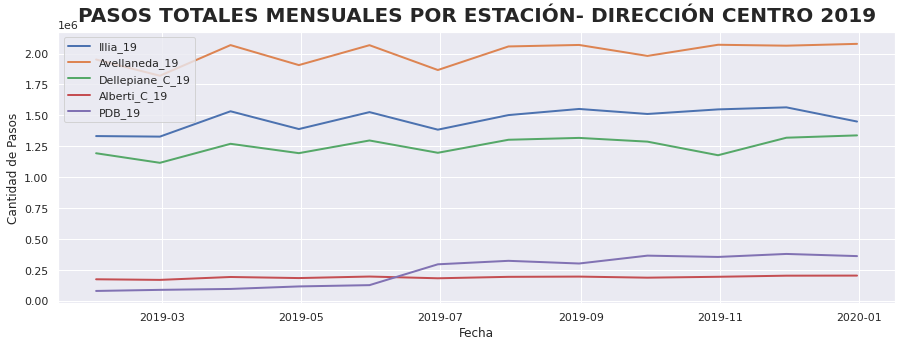

In [ ]:
#Resample por mes para mejorar la visualización de tendencia
Illia_19 = Illia_19.resample('M').sum()
Avellaneda_19 = Avellaneda_19.resample('M').sum()
Dellepiane_C_19 = Dellepiane_C_19.resample('M').sum()
Alberti_C_19 = Alberti_C_19.resample('M').sum()
PDB_19 = PDB_19.resample('M').sum()

#Graficando
plt.figure(figsize = (15,5))
plt.plot(Illia_19.cantidad_pasos, label = 'Illia_19', lw=2,linestyle="-")
plt.plot(Avellaneda_19.cantidad_pasos, label = 'Avellaneda_19', lw=2,linestyle="-")
plt.plot(Dellepiane_C_19.cantidad_pasos, label = 'Dellepiane_C_19', lw=2,linestyle="-")
plt.plot(Alberti_C_19.cantidad_pasos, label = 'Alberti_C_19', lw=2,linestyle="-")
plt.plot(PDB_19.cantidad_pasos, label = 'PDB_19', lw=2,linestyle="-")
plt.legend()
plt.title("PASOS TOTALES MENSUALES POR ESTACIÓN- DIRECCIÓN CENTRO 2019",pad=10, fontweight="bold", fontsize=20)

plt.xlabel('Fecha')
plt.ylabel('Cantidad de Pasos')
#plt.ylim(-10,40)
plt.show()

Las estaciones de peaje Illia, Avelanada, Dellepiane son las que tienen mayor afluencia de publico y visualmente para el primer semestre parecen compartir la tendencia hasta Octubre del 2019. Muy probablemente después de esa fecha haya un cambio por factores exogenos.

#### Revisando por Estación - Sentido Provincia

In [ ]:
#Filtrando por Sentido Provincia
Illia_P = (Illia["sentido"] == "Provincia")
Illia_P = Illia[Illia_P]
Illia_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Illia_P.set_index('fecha', inplace=True)
Illia_P = Illia_P.resample('D').sum()


Avellaneda_P = (Avellaneda["sentido"] == "Provincia")
Avellaneda_P = Avellaneda[Avellaneda_P]
Avellaneda_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Avellaneda_P.set_index('fecha', inplace=True)
Avellaneda_P = Avellaneda_P.resample('D').sum()


Retiro_P = (Retiro["sentido"] == "Provincia")
Retiro_P = Retiro[Retiro_P]
Retiro_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Retiro_P.set_index('fecha', inplace=True)
Retiro_P = Retiro_P.resample('D').sum()


Salguero_P = (Salguero["sentido"] == "Provincia")
Salguero_P = Salguero[Salguero_P]
Salguero_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Salguero_P.set_index('fecha', inplace=True)
Salguero_P = Salguero_P.resample('D').sum()


Alberdi_P = (Alberdi["sentido"] == "Provincia")
Alberdi_P = Alberdi[Alberdi_P]
Alberdi_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Alberdi_P.set_index('fecha', inplace=True)
Alberdi_P = Alberdi_P.resample('D').sum()


Sarmiento_P = (Sarmiento["sentido"] == "Provincia")
Sarmiento_P = Sarmiento[Sarmiento_P]
Sarmiento_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Sarmiento_P.set_index('fecha', inplace=True)
Sarmiento_P = Sarmiento_P.resample('D').sum()


Dellepiane_P = (Dellepiane["sentido"] == "Provincia")
Dellepiane_P = Dellepiane[Dellepiane_P]
Dellepiane_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Dellepiane_P.set_index('fecha', inplace=True)
Dellepiane_P = Dellepiane_P.resample('D').sum()


Alberti_P = (Alberti["sentido"] == "Provincia")
Alberti_P = Alberti[Alberti_P]
Alberti_P.drop(columns = ["estacion",'sentido'], inplace = True)
#Alberti_P.set_index('fecha', inplace=True)
Alberti_P = Alberti_P.resample('D').sum()


PDB_P = (PDB["sentido"] == "Provincia")
PDB_P = PDB[PDB_P]
PDB_P.drop(columns = ["estacion",'sentido'], inplace = True)
#PDB_P.set_index('fecha', inplace=True)
PDB_P = PDB_P.resample('D').sum()



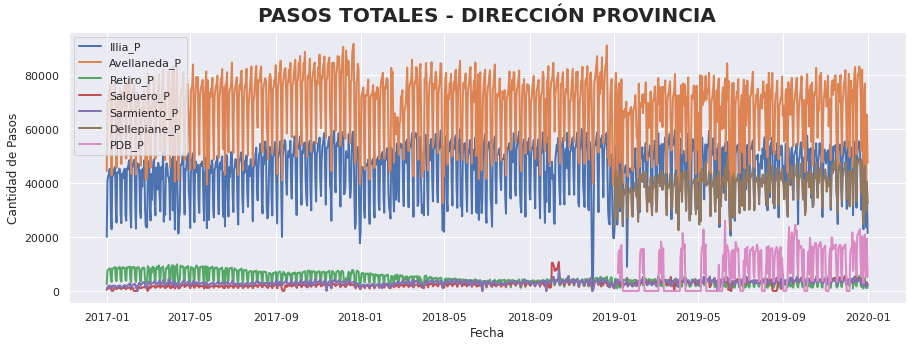

In [ ]:
#Graficando
plt.figure(figsize = (15,5))
plt.plot(Illia_P.cantidad_pasos, label = 'Illia_P', lw=2,linestyle="-")
plt.plot(Avellaneda_P.cantidad_pasos, label = 'Avellaneda_P', lw=2,linestyle="-")
plt.plot(Retiro_P.cantidad_pasos, label = 'Retiro_P', lw=2,linestyle="-")
plt.plot(Salguero_P.cantidad_pasos, label = 'Salguero_P', lw=2,linestyle="-")
plt.plot(Sarmiento_P.cantidad_pasos, label = 'Sarmiento_P', lw=2,linestyle="-")
plt.plot(Dellepiane_P.cantidad_pasos, label = 'Dellepiane_P', lw=2,linestyle="-")
plt.plot(PDB_P.cantidad_pasos, label = 'PDB_P', lw=2,linestyle="-")
plt.legend()
plt.title("PASOS TOTALES - DIRECCIÓN PROVINCIA",pad=10, fontweight="bold", fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Pasos')
plt.show()

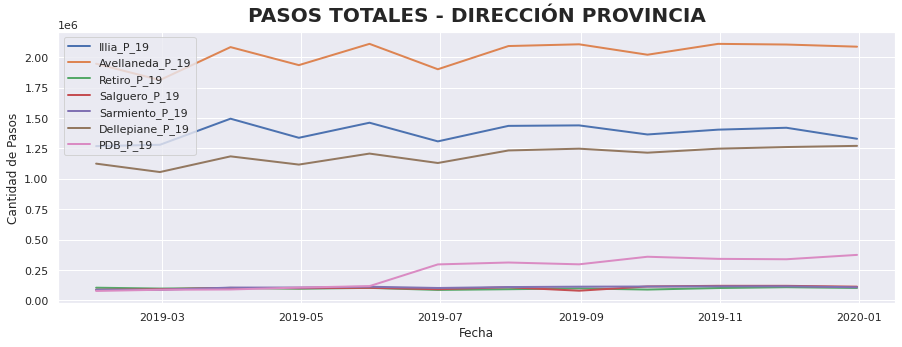

In [ ]:
"""
Como están en distinto periodo y hay una baja en el 2019 estudiaré ese año
Por lo que filtraré el dataset y haré un resample por mes
"""
filter = (Illia_P.index >= start_date) & (Illia_P.index 	<= end_date)
Illia_P_19 = pd.DataFrame(Illia_P[filter])
Illia_P_19 = Illia_P_19.resample('M').sum()


filter = (Avellaneda_P.index >= start_date) & (Avellaneda_P.index 	<= end_date)
Avellaneda_P_19 = pd.DataFrame(Avellaneda_P[filter])
Avellaneda_P_19 = Avellaneda_P_19.resample('M').sum()

filter = (Retiro_P.index >= start_date) & (Retiro_P.index 	<= end_date)
Retiro_P_19 = pd.DataFrame(Retiro_P[filter])
Retiro_P_19 = Retiro_P_19.resample('M').sum()

filter = (Salguero_P.index >= start_date) & (Salguero_P.index 	<= end_date)
Salguero_P_19 = pd.DataFrame(Salguero_P[filter])
Salguero_P_19 = Salguero_P_19.resample('M').sum()

filter = (Sarmiento_P.index >= start_date) & (Sarmiento_P.index 	<= end_date)
Sarmiento_P_19 = pd.DataFrame(Sarmiento_P[filter])
Sarmiento_P_19 = Sarmiento_P_19.resample('M').sum()

filter = (Dellepiane_P.index >= start_date) & (Dellepiane_P.index 	<= end_date)
Dellepiane_P_19 = pd.DataFrame(Dellepiane_P[filter])
Dellepiane_P_19 = Dellepiane_P_19.resample('M').sum()

filter = (PDB_P.index >= start_date) & (PDB_P.index 	<= end_date)
PDB_P_19 = pd.DataFrame(PDB_P[filter])
PDB_P_19 = PDB_P_19.resample('M').sum()


#Graficando
plt.figure(figsize = (15,5))
plt.plot(Illia_P_19.cantidad_pasos, label = 'Illia_P_19', lw=2,linestyle="-")
plt.plot(Avellaneda_P_19.cantidad_pasos, label = 'Avellaneda_P_19', lw=2,linestyle="-")
plt.plot(Retiro_P_19.cantidad_pasos, label = 'Retiro_P_19', lw=2,linestyle="-")
plt.plot(Salguero_P_19.cantidad_pasos, label = 'Salguero_P_19', lw=2,linestyle="-")
plt.plot(Sarmiento_P_19.cantidad_pasos, label = 'Sarmiento_P_19', lw=2,linestyle="-")
plt.plot(Dellepiane_P_19.cantidad_pasos, label = 'Dellepiane_P_19', lw=2,linestyle="-")
plt.plot(PDB_P_19.cantidad_pasos, label = 'PDB_P_19', lw=2,linestyle="-")
plt.legend()
plt.title("PASOS TOTALES - DIRECCIÓN PROVINCIA",pad=10, fontweight="bold", fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Pasos')
plt.show()

In [ ]:
#plt.plot(PDB_P_19.cantidad_pasos, label = 'PDB_P_19', lw=2,linestyle="-")

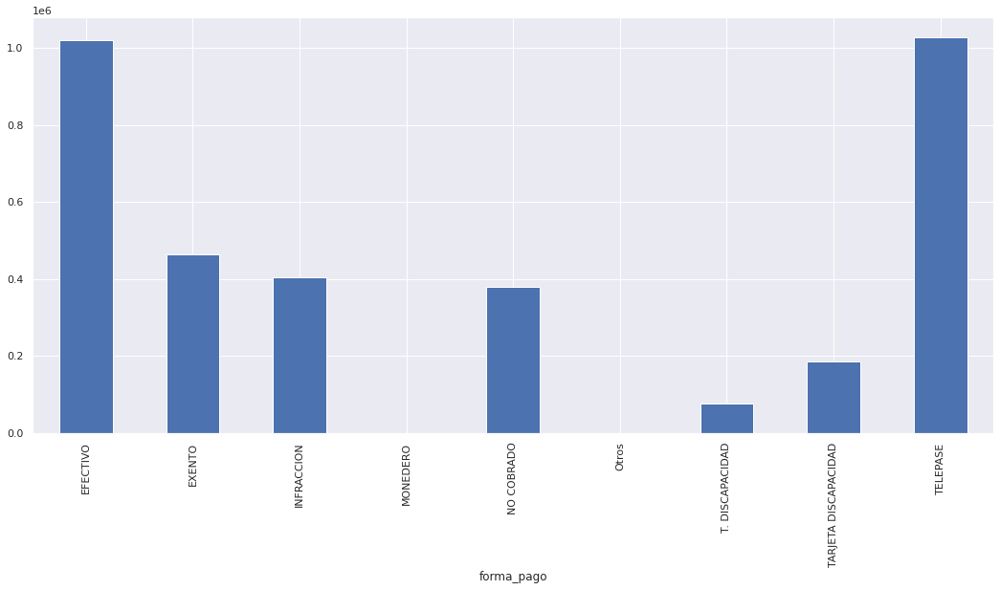

In [ ]:
#Revisando la forma de pago
data.groupby("forma_pago")["forma_pago"].count().plot(kind="bar")

Por lo expuesto anteriormente y comparando las graficas del flujo de vehiculo en Illia v/s el flujo de vehiculo en otras estaciones, se concluye que Illia está dentro de las 3 estaciones de peaje más frecuentadas y comparten la tendencia. 
La correlación negativa al momento de analizar la modalidad efectivo nos habla de una migración en la forma de pagar que ocurre en mayo del 2018.

### 4.3.- Si lo deseas, puedes agregar información de años anteriores a 2017. ¿Mejoran los resultados?

Dado que existe un evento exogeno que lo que causa mayor impacto en la serie como lo es el pago, es muy probable que no existan grandes mejoras.

### 4.4.- PARTE C - ¿Hay algo que te gustaría investigar o probar?

#### Resumen:
**Objetivo:**
Realizar una preddicción del flujo  vehicular de la autopista Illia 2020

- Descripción del problema:
> Dado el actual contexto de pandemia y la nula historia previa de ello, es que no se cuenta con datos que absorban este acontecimiento por lo que para las predicciones del 2020 me gustaría implementar un modelo de aprendizaje profundo usando redes neuronales para el pronóstico de series de tiempo univariantes y finalizar con una búsqueda de GridSearch de modelos de aprendizaje profundo para el pronóstico de series. Para el preprocesamiento de datos pensaba implementar una categorización de cuando existan restricciones, como por ejemplo lo sería una cuarentena o alguna especie de restricción al desplazamiento.

- Resultados Esperados:
> Un modelo que sea capaz de predecir y absorver la volatilidad del flujo vehicular para el año 2020 considerando contexto de Pandemia
.






#### Redes Neuronales
Para poder conseguir una predicción compleja como lo es la del año 2020 intentaré implemenar las redes neuronales de aprendizaje profundo ya que son capaces de aprender y extraer características automáticamente de los datos sin procesar.
Esta característica de las redes neuronales se puede utilizar para problemas de predicción de series de tiempo, donde los modelos se pueden desarrollar directamente sobre las observaciones sin procesar sin la necesidad directa de escalar los datos mediante la normalización y estandarización o hacer que los datos sean estacionarios mediante diferenciación.

Los modelos sencillos de redes neuronales de aprendizaje profundo son capaces de realizar pronósticos hábiles en comparación con modelos simples y modelos SARIMA ajustados en problemas de pronóstico de series de tiempo univariantes que tienen componentes de tendencia y estacionales sin procesamiento previo.

Los proximos pasos seran:
- Desarrollar un test harness robusto mediante walk-forward validation (validación de avance) para evaluar el rendimiento de los modelos de redes neuronales.
- Desarrollar y evaluar Perceptron multicapa simple y redes neuronales convolucionales para el pronóstico de series de tiempo.
- Desarrollar y evaluar el modelo de redes neuronales LSTM, CNN-LSTM y ConvLSTM para el pronóstico de series de tiempo.

Todo esto con el foco de pronosticar el año 2020.


In [ ]:
#Importando las librerias basicas y necesarias
import pandas as pd #Libreria de manipulacion de datos
import numpy as np #Libreria numerica muy potente
import matplotlib.pyplot as plt #Libreria para graficos
import seaborn as sns #Libreria para graficos basada en Matplotlib (es mas simple)
import datetime


# IMPORTO LAS LIBRERIAS NECESITARÉ PARA EL MODELO DE MACHINE LEARNING
import pandas as pd
from sklearn.model_selection import train_test_split #Separar conjunto de dataset en valores de entrenamiento
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
from google.colab import drive
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer
from sklearn.metrics import mean_squared_error
from sklearn.metrics import median_absolute_error
sns.set()


In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
data_2020 = pd.read_csv("/content/gdrive/MyDrive/Colab_Notebooks/PROYECTO_4/flujo-vehicular-2020.csv", sep =',')
data_2019 = pd.read_csv("/content/gdrive/MyDrive/Colab_Notebooks/PROYECTO_4/flujo-vehicular-2019.csv", sep =',')
data_2018 = pd.read_csv('/content/gdrive/MyDrive/Colab_Notebooks/PROYECTO_4/flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('/content/gdrive/MyDrive/Colab_Notebooks/PROYECTO_4/flujo-vehicular-2017.csv', sep =',')

#print("Columnas 2020", data_2020.columns)
print("Variables de la Columna Estación - 2020", data_2020['estacion'].unique())
print("Variables de la Columna Estación - 2019", data_2019['estacion'].unique())
print("Variables de la Columna Estación - 2018", data_2018['estacion'].unique())
print("Variables de la Columna Estación - 2017", data_2017['estacion'].unique())

Variables de la Columna Estación - 2020 ['ALBERDI' 'AVELLANEDA' 'DELLEPIANE LINIERSLEPIANE CENTRO'
 'DELLEPIANE LINIERS' 'ILLIA' 'ILP' 'PB1' 'PB3' 'PB4' 'RETIRO' 'SALGUERO'
 'SARMIENTO' 'PB2']
Variables de la Columna Estación - 2019 ['Alberti' 'Avellaneda' 'Dellepiane' 'Illia' 'Retiro' 'Salguero'
 'Sarmiento' 'PDB']
Variables de la Columna Estación - 2018 ['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']
Variables de la Columna Estación - 2017 ['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']


In [ ]:
#Filtramos los Dataset por estación Illia
filtro = (data_2020["estacion"] == "ILLIA")
data_2020 = data_2020[filtro]
filtro = (data_2019["estacion"] == "Illia")
data_2019 = data_2019[filtro]
filtro = (data_2018["estacion"] == "Illia")
data_2018 = data_2018[filtro]
filtro = (data_2017["estacion"] == "Illia")
data_2017 = data_2017[filtro]

#Unimos los 4 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
dataset = pd.concat([data_2020, data_2019, data_2018, data_2017])
print("Unimos los 3 datasets",dataset.shape)
dataset

Unimos los 3 datasets (1048605, 13)


,periodo,fecha,mes,dia,dia_fecha,hora_inicio,hora_fin,estacion,tipo_vehiculo,forma_pago,observacion,sentido,cantidad_pasos
52,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ILLIA,Auto,Efectivo,Efectivo,Centro,326.0
53,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ILLIA,Auto,Efectivo,Efectivo,Provincia,319.0
54,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ILLIA,Auto,Exento,Exento - Reglamento,Centro,2.0
55,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ILLIA,Auto,Exento,Exento - Reglamento,Provincia,1.0
56,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ILLIA,Auto,Rec.Deuda,Paso en Infracción,Centro,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1372324,2017.0,2017-12-31,NaN,Domingo,NaN,22.0,23.0,Illia,Pesado,EFECTIVO,NaN,Provincia,1.0
1372325,2017.0,2017-12-31,NaN,Domingo,NaN,22.0,23.0,Illia,Pesado,TELEPASE,NaN,Provincia,2.0
1372326,2017.0,2017-12-31,NaN,Domingo,NaN,22.0,23.0,Illia,Pesado,EFECTIVO,NaN,Provincia,1.0
1372327,2017.0,2017-12-31,NaN,Domingo,NaN,23.0,0.0,Illia,Liviano,NO COBRADO,NaN,Provincia,99.0


In [ ]:
#Nos quedamos solamente con la estación Illia
print("Nos quedamos solamente con la estación Illia",dataset.shape)

#Quitamos las columnas que no vamos a utilizar
dataset.drop(columns = ['periodo','hora_inicio', 'estacion'], inplace = True)
print("Quitamos las columnas que no vamos a utilizar",dataset.shape)

#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset.drop(columns=['fecha',"dia_fecha",'hora_fin'], inplace = True)


#Corregimos el nombre de fecha2 a fecha
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True) 

#Reordenamos el dataset por fecha
dataset.sort_values('fecha', inplace = True)
dataset.reset_index(drop=True, inplace = True)

#Resampleamos nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
series = dataset.resample('D', on = 'fecha').sum()
print("Revisando el Resample por día de Series ",series.shape)
series = pd.DataFrame(series)

#Reviso el total de valores faltantes NaN del dataset :
print("Los valores nulos del dataset son: ", series.isna().sum())
#Si no se utiliza el sum() va a devolver la condicion True o False de los campos


Nos quedamos solamente con la estación Illia (1048605, 13)
Quitamos las columnas que no vamos a utilizar (1048605, 10)
Revisando el Resample por día de Series  (1461, 1)
Los valores nulos del dataset son:  cantidad_pasos    0
dtype: int64


- Detección de Outliers: Esto debo revisarlo en mayor detalle para el proyecto 4 ya que haré la detección de outliers por año, pues se ha demostrad en el presente trabajo que los valores varian tendencialmente por año.

In [ ]:
"""
# Reviso un BoxPlot de la cantidad de pasos para sacar los Outliers
plt.figure(figsize = (15, 5))
sns.boxplot( x = 'cantidad_pasos',  data = series)
plt.title("INICIAL: VARIABLE CANTIDAD DE PASOS", pad=10, fontsize=20,fontweight="bold")
xt = plt.xticks(rotation=90)
print("Cantidad de instancias que tiene el Dataset antes de la eliminación de Outliers", series.shape)

valor_medio = series.cantidad_pasos.mean()
std = series.cantidad_pasos.std()
minimo = valor_medio - 3*std
maximo = valor_medio + 3*std
mascara_outliers = np.logical_or(series.cantidad_pasos < minimo, series.cantidad_pasos > maximo)
print("El número de outliers detectados es ",mascara_outliers.sum())
print("El Valor máximo es ", maximo)
print("El Valor mínimo es ", minimo)

#Sacando los Outliers
mascara = series["cantidad_pasos"]<maximo
series=series[mascara]
mascara = series["cantidad_pasos"]>minimo
series=series[mascara]

plt.figure(figsize = (15, 5))
sns.boxplot( x = 'cantidad_pasos',  data = series)
plt.title("FINAL: VARIABLE CANTIDAD DE PASOS", pad=10, fontsize=20,fontweight="bold")
xt = plt.xticks(rotation=90)
print("Cantidad de instancias que tiene el Dataset después de la eliminación de Outliers", series.shape)

#Paso a Data Frame
series = pd.DataFrame(series)
series
"""

'\n# Reviso un BoxPlot de la cantidad de pasos para sacar los Outliers\nplt.figure(figsize = (15, 5))\nsns.boxplot( x = \'cantidad_pasos\',  data = series)\nplt.title("INICIAL: VARIABLE CANTIDAD DE PASOS", pad=10, fontsize=20,fontweight="bold")\nxt = plt.xticks(rotation=90)\nprint("Cantidad de instancias que tiene el Dataset antes de la eliminación de Outliers", series.shape)\n\nvalor_medio = series.cantidad_pasos.mean()\nstd = series.cantidad_pasos.std()\nminimo = valor_medio - 3*std\nmaximo = valor_medio + 3*std\nmascara_outliers = np.logical_or(series.cantidad_pasos < minimo, series.cantidad_pasos > maximo)\nprint("El número de outliers detectados es ",mascara_outliers.sum())\nprint("El Valor máximo es ", maximo)\nprint("El Valor mínimo es ", minimo)\n\n#Sacando los Outliers\nmascara = series["cantidad_pasos"]<maximo\nseries=series[mascara]\nmascara = series["cantidad_pasos"]>minimo\nseries=series[mascara]\n\nplt.figure(figsize = (15, 5))\nsns.boxplot( x = \'cantidad_pasos\',  data 

(1461, 1)


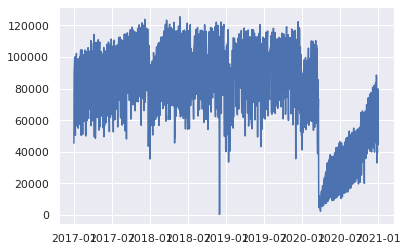

In [ ]:
from matplotlib import pyplot
# summarize shape
print(series.shape)
# plot
pyplot.plot(series)
pyplot.show()

Se crea un gráfico de líneas. El conjunto de datos tiene un quiebre obvio y un componente estacional. El período del componente estacional podría ser de un año.

El conjunto de datos es diario y tiene cuatro años o 1461 observaciones. Para las pruebas, Utilizaré el último semestre, o 182 observaciones (6 meses)como conjunto de pruebas.

A partir de experimentos anteriores, sabemos que un modelo simple puede lograr una raíz del error cuadrático medio, o RMSE, de 2206 tomando la mediana de las observaciones en los tres años anteriores para el mes que se predice.

Donde los índices negativos se refieren a observaciones en la serie relativas al final de los datos históricos para el mes que se predice.

De experimentos anteriores, sabemos que un modelo SARIMA puede lograr un RMSE de 7246.747 con la configuración de 
-   > Model SARIMA [ [ ( 0 , 0 , 0 ) , ( 2 , 0 , 2 , 6) , 'ct' ] ]   

Donde no se especifican elementos para la tendencia y una diferencia estacional. con un período de 12 se calcula y se utiliza un modelo AR de una temporada.

El rendimiento del modelo sencillo proporciona un límite inferior en un modelo que se considera hábil. Cualquier modelo que logre un rendimiento predictivo inferior a 7246.747 en los últimos meses tiene habilidad.

El rendimiento del modelo SARIMA proporciona una medida de un buen modelo sobre el problema. Cualquier modelo que logre un rendimiento predictivo inferior a 7246.747 en los últimos meses debe adoptarse sobre un modelo SARIMA.

Ahora que hemos definido nuestro problema y expectativas de la habilidad del modelo, podemos considerar la definición del est Harness (arnés de prueba).

#### Evaluación del Modelo Test Harness

Esta sección se divide en las siguientes partes:

- 1.- División de tren-prueba.
- 2.- Series de aprendizaje supervisado.
- 3.- Validación progresiva.
- 4.- Repetir evaluación.
- 5.- Resumir el rendimiento.

In [ ]:
"""
La función train_test_split () a continuación dividirá la serie tomando las observaciones 
sin procesar y el número de observaciones para usar en el conjunto de prueba como argumentos.
"""
# Dividir un conjunto de datos univariante en conjuntos de train / test
def train_test_split(data, n_test):
	return data[:-n_test], data[-n_test:]

##### 2.- Series de aprendizaje supervisado.

A continuación, necesitamos poder enmarcar la serie univariante de observaciones como un problema de aprendizaje supervisado para que podamos entrenar modelos de redes neuronales.

Un encuadre de aprendizaje supervisado de una serie significa que los datos deben dividirse en varios ejemplos de los que el modelo aprende y generaliza.

Cada muestra debe tener un componente de entrada y un componente de salida.

El componente de entrada será una serie de observaciones previas, como tres años o 1095 pasos de tiempo.

El componente de salida serán la "cantidad_pasos" totales en el próximo día que es porque estamos interesados ​​en desarrollar un modelo para hacer pronósticos de un solo paso.

Podemos implementar esto usando la función shift () en el DataFrame de pandas. Nos permite desplazar una columna hacia abajo (hacia adelante en el tiempo) o hacia atrás (hacia atrás en el tiempo). Podemos tomar la serie como una columna de datos, luego crear múltiples copias de la columna, desplazadas hacia adelante o hacia atrás en el tiempo para crear las muestras con los elementos de entrada y salida que necesitamos.

Cuando una serie se desplaza hacia abajo, se introducen valores de NaN porque no tenemos valores más allá del inicio de la serie.


In [ ]:
"""
La función series_to_supervised () a continuación implementa este comportamiento, lo que le permite especificar 
el número de observaciones de retraso para usar en la entrada y el número para usar en la salida para cada muestra. 
También eliminará las filas que tengan valores NaN, ya que no se pueden usar para entrenar o probar un modelo.
"""
# Transformar la lista en formato de aprendizaje supervisado
def series_to_supervised(data, n_in=1, n_out=1):
	df = DataFrame(data)#Paso la data a DataFrame
	cols = list()#Creo una lista
	# Secuencia de entrada (t-n, ... t-1)
	for i in range(n_in, 0, -1):# for de i en range de n inicial, 0 y -1
		cols.append(df.shift(i))#Guardo en la lista los valores del DF shift en el rango declarado anteriormente
	# Secuencia de Pronostico (t, t+1, ... t+n)
	for i in range(0, n_out):# For de i en range de 0, y numero de salida.
		cols.append(df.shift(-i))#Guardo en la lista los valores del DF shift en el rango negativo declarado anteriormente
	# Juntando..
	agg = concat(cols, axis=1)
	# Borrando las filas con valores NaN
	agg.dropna(inplace=True)
	return agg.values

##### 3.- Validación progresiva.

Los modelos de predicción de series de tiempo se pueden evaluar en un conjunto de prueba mediante la validación de avance.

La validación de avance es un enfoque en el que el modelo hace un pronóstico para cada observación en el conjunto de datos de prueba, una por una. Después de que se realiza cada pronóstico para un paso de tiempo en el conjunto de datos de prueba, la observación verdadera para el pronóstico se agrega al conjunto de datos de prueba y se pone a disposición del modelo.

Los modelos más simples se pueden reajustar con la observación antes de realizar la predicción posterior. Los modelos más complejos, como las redes neuronales, no se reajustan debido al costo computacional mucho mayor.

No obstante, la observación real del paso de tiempo se puede utilizar como parte de la entrada para realizar la predicción del siguiente paso de tiempo. 

Primero, el conjunto de datos se divide en conjuntos de prueba y de tren. Llamaremos al train_test_split () función para realizar esta división y pasar el número preespecificado de observaciones para usar como datos de prueba. Un modelo se ajustará una vez al conjunto de datos de entrenamiento para una configuración determinada.



In [ ]:
"""
Definiremos una función model_fit () genérica para realizar esta operación que se puede completar para el tipo
dado de red neuronal que nos puede servirá más adelante. La función toma el conjunto de datos de entrenamiento
y la configuración del modelo y devuelve el modelo de ajuste listo para realizar predicciones.
"""
# Entrenar el modelo
def model_fit(train, config):
	return None

In [ ]:
"""
Se enumera cada paso de tiempo del conjunto de datos de prueba. Se hace una predicción utilizando el modelo de ajuste.
Nuevamente, definiremos una función genérica llamada model_predict () que toma el modelo de ajuste, el historial 
y la configuración del modelo y hace una predicción de un solo paso.
"""

# Pronóstico con un modelo pre-ajustado
def model_predict(model, history, config):
	return 0.0

La predicción se agrega a una lista de predicciones y la observación verdadera del conjunto de prueba se agrega a una lista de observaciones que se sembró con todas las observaciones del conjunto de datos de entrenamiento. Esta lista se crea durante cada paso de la validación de avance, lo que permite que el modelo haga una predicción de un paso utilizando el historial más reciente.

Todas las predicciones se pueden comparar con los valores reales en el conjunto de prueba y se puede calcular una medida de error.

Calcularemos la raíz del error cuadrático medio, o RMSE, entre las predicciones y los valores reales.



In [ ]:
"""
El RMSE se calcula como la raíz cuadrada del promedio de las diferencias al cuadrado entre los pronósticos 
y los valores reales. La medida_rmse () implementa esto a continuación usando la función 
mean_squared_error () scikit-learn para calcular primero el error cuadrático medio, o MSE,
antes de calcular la raíz cuadrada.
"""
# Raíz cuadrada media error de Rmse
def measure_rmse(actual, predicted):
	return sqrt(mean_squared_error(actual, predicted))

In [ ]:
"""
La  función walk_forward_validation () completa que une todo esto se enumera a continuación.
Toma el conjunto de datos, el número de observaciones que se utilizarán como conjunto de prueba
y la configuración del modelo, posteriormente devuelve el RMSE para el rendimiento del modelo 
en el conjunto de prueba.
"""
# Validación de avance para datos univariados
def walk_forward_validation(data, n_test, cfg):
	predictions = list()#creo una lista
	# Separo el dataset
	train, test = train_test_split(data, n_test)
	# Entreno el modelo
	model = model_fit(train, cfg)
	# Semilla history con training dataset
	history = [x for x in train]
	# Pasar por encima de cada paso de tiempo en el conjunto de prueba
	for i in range(len(test)):
		# Entrenar el modelo y hacer un pronostico para la hisoria  
		yhat = model_predict(model, history, cfg)
		# Almacenar el pronóstico en la lista de predicciones
		predictions.append(yhat)
		# Agregando la observación actual al historial para el siguiente ciclo
		history.append(test[i])
	# Estimando la predicción del  error
	error = measure_rmse(test, predictions)
	print(' > %.3f' % error)
	return error

##### 4.- Repetir Evaluación.

Los modelos de redes neuronales son estocásticos.
Esto significa que, dada la misma configuración del modelo y el mismo conjunto de datos de entrenamiento, cada vez que se entrena el modelo se obtendrá un conjunto interno diferente de ponderaciones que, a su vez, tendrá un rendimiento diferente.

Este es un beneficio, ya que permite que el modelo sea adaptable y encuentre configuraciones de alto rendimiento para problemas complejos.


Para abordar la evaluación del modelo, evaluaremos la configuración de un modelo varias veces mediante la validación progresiva e informaremos el error como el error promedio en cada evaluación.

Esto no siempre es posible para las grandes redes neuronales y puede que solo tenga sentido para las redes pequeñas que se pueden instalar en minutos u horas.

In [ ]:
"""
La función repeat_evaluate () a continuación implementa esto y permite especificar el número 
de repeticiones como un parámetro opcional que por defecto es 30 y devuelve una lista de puntuaciones 
de rendimiento del modelo: en este caso, valores RMSE.
"""
# Repetir la evaluación de una configuración
def repeat_evaluate(data, config, n_test, n_repeats=30):
	# Ajustar y evaluar el modelo n veces
	scores = [walk_forward_validation(data, n_test, config) for _ in range(n_repeats)]
	return scores


##### 5.- Resumir el rendimiento.

Finalmente, necesitamos resumir el desempeño de un modelo a partir de múltiples repeticiones.
Primero resumiremos el rendimiento utilizando estadísticas de resumen, específicamente la media y la desviación estándar.

También trazaremos la distribución de las puntuaciones de rendimiento del modelo utilizando un diagrama de caja y bigotes para ayudar a tener una idea de la distribución del rendimiento.

In [ ]:
"""
La función resume_scores () a continuación implementa esto, tomando el nombre del modelo que 
fue evaluado y la lista de puntajes de cada evaluación repetida, imprimiendo el resumen y 
mostrando un gráfico.
"""
# Resumir el rendimiento del modelo
def summarize_scores(name, scores):
	# Imprimir  summary
	scores_m, score_std = mean(scores), std(scores)
	print('%s: %.3f RMSE (+/- %.3f)' % (name, scores_m, score_std))
	# Diagrama de caja y bigotes
	pyplot.boxplot(scores)
	pyplot.show()

In [ ]:
"""
La función model_predict () se puede implementar para usar esta configuración para recopilar las observaciones 
y luego devolver la mediana de esas observaciones.
"""
# Pronóstico con un modelo pre-ajustado
def model_predict(model, history, config):
	values = list()# Creo una lista en blanco
	for offset in config: # Ciclo for en lista configuración.
		values.append(history[-offset])# Guardo en una lista los resultados de history con lo parametrosde config
	return median(values)#Retorna la media de la lista valores

##### Aplicando:
Aplicando el uso del marco con un modelo de persistencia simple se enumera a continuación:



In [ ]:
data = series.values

# División de datos
n_test = 90 #Pensando en 3 meses

# Defino la Config
"""
Usaremos la configuración para definir una lista de compensaciones de índice en las observaciones anteriores 
en relación con el tiempo a pronosticar que se usará como predicción. 
Por ejemplo, 7 utilizará la observación de hace 7 dias (7) en relación con el tiempo a pronosticar.
"""
config = [7, 14, 21, 30]

 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
 > 12068.986
persistence: 12068.986 RMSE (+/- 0.000)


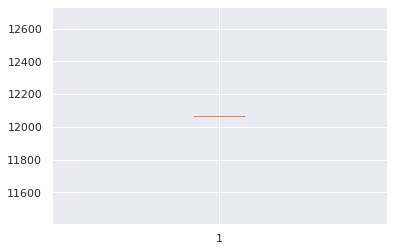

In [ ]:
# persistence
from math import sqrt
from numpy import mean
from numpy import std
from pandas import DataFrame
from pandas import concat
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from statistics import *

# Grid Search
scores = repeat_evaluate(data, config, n_test)
# summarize scores
summarize_scores('persistence', scores)


El grafico arroja el diagrama de caja y bigotes de persistencia RMSE Pronóstico de Cantidad de Pasos.

Podemos ver que el RMSE del modelo es 12068.986, lo que proporciona un límite superior al revisado del modelo anterior pero nos da un punto de inicio para evaluar si un modelo es hábil o no en el problema.
Al ejecutar el ejemplo, se imprime el RMSE del modelo evaluado mediante la validación de avance en los últimos 90 días de datos (3 meses).

El modelo se evalúa 30 veces, aunque, debido a que el modelo no tiene elemento estocástico, la puntuación es la misma cada vez.


Los proximos pasos seran:
- Desarrollar y evaluar Perceptron multicapa simple y redes neuronales convolucionales para el pronóstico de series de tiempo.
- Desarrollar y evaluar el modelo de redes neuronales LSTM, CNN-LSTM y ConvLSTM para el pronóstico de series de tiempo.

Se espera obtener predicción del 2020 